# 01 – Data Exploration for Medical Imaging Datasets

**MSc Dissertation: Tri-Objective, Concept-Stable Robust Explainable AI for Medical Imaging**


## Notebook Overview

This notebook provides comprehensive exploratory data analysis (EDA) for the medical imaging datasets used in this dissertation. The analysis directly utilizes the production dataset classes and validation utilities from the project codebase.

### Objectives (Aligned with Section 2.4.3)

1. **Dataset Loading** – Load datasets using `src.datasets.*` classes with the same factory pattern as `validate_data.py`
2. **Sample Visualization** – Display representative images with ground truth labels
3. **Class Distribution Analysis** – Compute and visualize class frequencies, imbalance ratios, and class weights
4. **Image Property Analysis** – Examine dimensions, file sizes, formats, and pixel intensity statistics
5. **Augmentation Visualization** – Preview training augmentation pipeline effects on sample images
6. **Cross-Split Comparison** – Compare distributions across train/val/test splits

### Supported Datasets

| Dataset | Domain | Task | Classes |
|---------|--------|------|---------|
| ISIC2018/2019/2020 | Dermoscopy | Skin lesion classification | 7-9 |
| Derm7pt | Dermoscopy | Diagnosis + concepts | 2 |
| NIH ChestX-ray14 | Chest X-ray | Multi-label pathology | 14 |
| PadChest | Chest X-ray | Multi-label pathology | 19+ |



## Cell 2: Core Imports (Code)

In [28]:
"""
Core imports for data exploration notebook.

This cell imports all required libraries and configures the notebook environment.
All imports are verified to work with the project's virtual environment.
"""
from __future__ import annotations

# =============================================================================
# STANDARD LIBRARY
# =============================================================================
import os
import sys
import random
import warnings
from pathlib import Path
from collections import Counter
from typing import Any, Dict, List, Optional, Tuple, Union

# =============================================================================
# SCIENTIFIC COMPUTING
# =============================================================================
import numpy as np
import pandas as pd

# =============================================================================
# VISUALIZATION
# =============================================================================
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image

# =============================================================================
# DEEP LEARNING
# =============================================================================
import torch

# =============================================================================
# PROGRESS BARS (for Jupyter)
# =============================================================================
from tqdm.notebook import tqdm

# =============================================================================
# NOTEBOOK CONFIGURATION
# =============================================================================

# Enable inline plotting
%matplotlib inline

# Suppress non-critical warnings for cleaner output
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Print versions for reproducibility documentation
print("=" * 60)
print("ENVIRONMENT INFORMATION")
print("=" * 60)
print(f"Python version: {sys.version.split()[0]}")
print(f"NumPy version:  {np.__version__}")
print(f"Pandas version: {pd.__version__}")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
print("=" * 60)

ENVIRONMENT INFORMATION
Python version: 3.11.9
NumPy version:  1.26.4
Pandas version: 2.3.3
PyTorch version: 2.5.1+cu121
CUDA available: True
CUDA device: NVIDIA GeForce RTX 3050 Laptop GPU


In [29]:
"""
Detect project root and configure Python path.

This ensures imports work correctly whether the notebook is run from:
- notebooks/ directory
- project root directory
- any subdirectory
"""

# =============================================================================
# DETECT PROJECT ROOT
# =============================================================================

def find_project_root(markers: List[str] = None) -> Path:
    """
    Find project root by looking for marker files/directories.
    
    Parameters
    ----------
    markers : list of str
        Files or directories that indicate project root.
        Default: ["pyproject.toml", "setup.py", "src", ".git"]
        
    Returns
    -------
    Path
        Absolute path to project root
        
    Raises
    ------
    FileNotFoundError
        If project root cannot be determined
    """
    if markers is None:
        markers = ["pyproject.toml", "setup.py", "src", ".git"]
    
    # Start from current working directory
    current = Path.cwd().resolve()
    
    # If we're in notebooks/, go up one level
    if current.name == "notebooks":
        current = current.parent
    
    # Search upward for project markers
    search_path = current
    for _ in range(10):  # Limit search depth
        for marker in markers:
            if (search_path / marker).exists():
                return search_path
        
        parent = search_path.parent
        if parent == search_path:  # Reached filesystem root
            break
        search_path = parent
    
    # Fallback: assume current directory is project root
    return Path.cwd().resolve()


# Detect and set project root
PROJECT_ROOT = find_project_root()

# Add project root to Python path for imports
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

# Verify critical directories exist
src_dir = PROJECT_ROOT / "src"
data_dir = PROJECT_ROOT / "data"
scripts_dir = PROJECT_ROOT / "scripts"

print("=" * 60)
print("PROJECT CONFIGURATION")
print("=" * 60)
print(f"Project root: {PROJECT_ROOT}")
print(f"src/ exists:  {src_dir.exists()}")
print(f"data/ exists: {data_dir.exists()}")
print(f"scripts/ exists: {scripts_dir.exists()}")
print("=" * 60)

# Validate project structure
if not src_dir.exists():
    raise FileNotFoundError(
        f"Source directory not found: {src_dir}\n"
        f"Please ensure you're running from the correct location."
    )

PROJECT CONFIGURATION
Project root: C:\Users\Dissertation\tri-objective-robust-xai-medimg
src/ exists:  True
data/ exists: True
scripts/ exists: True


In [30]:
"""
Dataset configuration and global parameters.

IMPORTANT: Modify DATA_ROOT and paths to match your system setup.
Your datasets are located in F: drive.
"""

# =============================================================================
# DATASET SELECTION
# =============================================================================

# Choose which dataset to explore
# Options: "isic2018", "isic2019", "isic2020", "derm7pt", "nih_cxr", "padchest"
DATASET_KEY = "isic2018"

# Splits to analyze
SPLITS = ["train", "val", "test"]

# =============================================================================
# DATA PATHS - CONFIGURED FOR F: DRIVE
# =============================================================================

# Base data directory on F: drive
DATA_BASE = Path("/content/drive/MyDrive/data")

# Dataset-specific root directories
# NOTE: Folder names match your actual directory structure
DATA_ROOTS = {
    "isic2018": DATA_BASE / "isic_2018",
    "isic2019": DATA_BASE / "isic_2019",
    "isic2020": DATA_BASE / "isic_2020",
    "derm7pt": DATA_BASE / "derm7pt",
    "nih_cxr": DATA_BASE / "nih_cxr",
    "padchest": DATA_BASE / "padchest",
}

# Default CSV paths (assumes metadata.csv in each dataset root)
CSV_PATHS = {
    key: root / "metadata.csv" 
    for key, root in DATA_ROOTS.items()
}

# Get paths for selected dataset
DATA_ROOT = DATA_ROOTS[DATASET_KEY]
CSV_PATH = CSV_PATHS[DATASET_KEY]

# =============================================================================
# REPRODUCIBILITY
# =============================================================================

RANDOM_SEED = 42

# Set all random seeds
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# =============================================================================
# EXPLORATION PARAMETERS
# =============================================================================

NUM_SAMPLES_TO_SHOW = 16              # Random samples to display in grid
NUM_AUGMENTATION_PAIRS = 8            # Before/after augmentation pairs
MAX_IMAGES_FOR_STATS = 500            # Max images for size/property analysis
IMBALANCE_THRESHOLD = 5.0             # Ratio threshold for imbalance warning

# =============================================================================
# VISUALIZATION SETTINGS
# =============================================================================

FIGURE_DPI = 150
FIGURE_SIZE_SMALL = (10, 6)
FIGURE_SIZE_MEDIUM = (14, 8)
FIGURE_SIZE_LARGE = (16, 10)

# Configure matplotlib defaults
plt.rcParams["figure.dpi"] = FIGURE_DPI
plt.rcParams["savefig.dpi"] = FIGURE_DPI
plt.rcParams["figure.figsize"] = FIGURE_SIZE_MEDIUM
plt.rcParams["font.size"] = 10
plt.rcParams["axes.titlesize"] = 12
plt.rcParams["axes.labelsize"] = 10
plt.rcParams["xtick.labelsize"] = 9
plt.rcParams["ytick.labelsize"] = 9
plt.rcParams["legend.fontsize"] = 9
plt.rcParams["figure.titlesize"] = 14

# Set seaborn style
sns.set_style("whitegrid")
sns.set_palette("husl")

# Configure pandas display
pd.set_option("display.max_columns", 50)
pd.set_option("display.max_rows", 100)
pd.set_option("display.float_format", "{:.3f}".format)
pd.set_option("display.width", 120)

# =============================================================================
# VALIDATE CONFIGURATION
# =============================================================================

print("=" * 60)
print("DATASET CONFIGURATION")
print("=" * 60)
print(f"Selected dataset: {DATASET_KEY.upper()}")
print(f"Data root:        {DATA_ROOT}")
print(f"CSV path:         {CSV_PATH}")
print(f"Splits:           {SPLITS}")
print(f"Random seed:      {RANDOM_SEED}")
print()

# Check if paths exist
if DATA_ROOT.exists():
    print(f"✅ Data root exists: {DATA_ROOT}")
    
    # List contents
    contents = list(DATA_ROOT.iterdir())
    print(f"   Contents: {len(contents)} items")
    for item in contents[:10]:  # Show first 10
        item_type = "📁" if item.is_dir() else "📄"
        print(f"   {item_type} {item.name}")
    if len(contents) > 10:
        print(f"   ... and {len(contents) - 10} more")
else:
    print(f"❌ Data root NOT FOUND: {DATA_ROOT}")
    print(f"   Please verify the path exists on your F: drive")

print()

if CSV_PATH.exists():
    print(f"✅ CSV file exists: {CSV_PATH}")
    # Preview CSV
    try:
        df_preview = pd.read_csv(CSV_PATH, nrows=5)
        print(f"   Columns: {list(df_preview.columns)}")
        print(f"   Preview rows: {len(df_preview)}")
    except Exception as e:
        print(f"   ⚠️ Could not preview CSV: {e}")
else:
    print(f"❌ CSV file NOT FOUND: {CSV_PATH}")
    print(f"   Please ensure metadata.csv exists in the dataset folder")

print("=" * 60)

DATASET CONFIGURATION
Selected dataset: ISIC2018
Data root:        F:\data\isic_2018
CSV path:         F:\data\isic_2018\metadata.csv
Splits:           ['train', 'val', 'test']
Random seed:      42

✅ Data root exists: F:\data\isic_2018
   Contents: 16 items
   📁 ISIC2018_Task1-2_Test_Input
   📁 ISIC2018_Task1-2_Training_Input
   📁 ISIC2018_Task1-2_Validation_Input
   📁 ISIC2018_Task1_Test_GroundTruth
   📁 ISIC2018_Task1_Training_GroundTruth
   📁 ISIC2018_Task1_Validation_GroundTruth
   📁 ISIC2018_Task3_Test_GroundTruth
   📁 ISIC2018_Task3_Test_Input
   📁 ISIC2018_Task3_Training_GroundTruth
   📁 ISIC2018_Task3_Training_Input
   ... and 6 more

✅ CSV file exists: F:\data\isic_2018\metadata.csv
   Columns: ['image_id', 'image_path', 'label', 'split']
   Preview rows: 5
   Columns: ['image_id', 'image_path', 'label', 'split']
   Preview rows: 5


In [31]:
"""
Create metadata.csv from ISIC2018 ground truth files.

This cell consolidates the original ISIC2018 challenge files into a single
metadata.csv that our dataset classes can use.
"""

# =============================================================================
# ISIC2018 METADATA GENERATOR
# =============================================================================

def create_isic2018_metadata(data_root: Path) -> pd.DataFrame:
    """
    Create consolidated metadata CSV from ISIC2018 Task3 ground truth files.
    
    ISIC2018 Task3 is skin lesion classification with 7 classes:
    - MEL: Melanoma
    - NV: Melanocytic nevus
    - BCC: Basal cell carcinoma
    - AKIEC: Actinic keratosis / Bowen's disease
    - BKL: Benign keratosis
    - DF: Dermatofibroma
    - VASC: Vascular lesion
    
    Parameters
    ----------
    data_root : Path
        Root directory of ISIC2018 dataset
        
    Returns
    -------
    pd.DataFrame
        Consolidated metadata with columns: image_id, split, label, image_path
    """
    
    # Define paths to ground truth files and image directories
    splits_config = {
        "train": {
            "gt_file": data_root / "ISIC2018_Task3_Training_GroundTruth" / "ISIC2018_Task3_Training_GroundTruth.csv",
            "image_dir": data_root / "ISIC2018_Task1-2_Training_Input",
        },
        "val": {
            "gt_file": data_root / "ISIC2018_Task3_Validation_GroundTruth" / "ISIC2018_Task3_Validation_GroundTruth.csv",
            "image_dir": data_root / "ISIC2018_Task1-2_Validation_Input",
        },
        "test": {
            "gt_file": data_root / "ISIC2018_Task3_Test_GroundTruth" / "ISIC2018_Task3_Test_GroundTruth.csv",
            "image_dir": data_root / "ISIC2018_Task3_Test_Input",
        },
    }
    
    # Class names in the order they appear in ground truth
    class_names = ["MEL", "NV", "BCC", "AKIEC", "BKL", "DF", "VASC"]
    
    all_records = []
    
    for split_name, config in splits_config.items():
        gt_file = config["gt_file"]
        image_dir = config["image_dir"]
        
        # Check if ground truth file exists
        if not gt_file.exists():
            print(f"⚠️ Ground truth not found for {split_name}: {gt_file}")
            # Try alternative path structure
            alt_gt = data_root / f"ISIC2018_Task3_{split_name.title()}_GroundTruth.csv"
            if alt_gt.exists():
                gt_file = alt_gt
                print(f"   Found alternative: {alt_gt}")
            else:
                continue
        
        print(f"Processing {split_name} split from: {gt_file.name}")
        
        # Read ground truth CSV
        df_gt = pd.read_csv(gt_file)
        
        # Get image ID column (usually first column)
        image_col = df_gt.columns[0]
        
        for idx, row in df_gt.iterrows():
            image_id = row[image_col]
            
            # Find the class with value 1.0 (one-hot encoded)
            label = None
            for class_name in class_names:
                if class_name in df_gt.columns and row[class_name] == 1.0:
                    label = class_name
                    break
            
            if label is None:
                # Try to find any column with value 1
                for col in df_gt.columns[1:]:
                    if row[col] == 1.0:
                        label = col
                        break
            
            if label is None:
                print(f"   ⚠️ No label found for {image_id}")
                continue
            
            # Construct image path
            image_path = image_dir / f"{image_id}.jpg"
            
            # Check for alternative extensions if .jpg not found
            if not image_path.exists():
                for ext in [".png", ".jpeg", ".JPG", ".PNG"]:
                    alt_path = image_dir / f"{image_id}{ext}"
                    if alt_path.exists():
                        image_path = alt_path
                        break
            
            all_records.append({
                "image_id": image_id,
                "split": split_name,
                "label": label,
                "image_path": str(image_path.relative_to(data_root)),
            })
        
        print(f"   ✅ Processed {len(df_gt)} images")
    
    # Create DataFrame
    metadata_df = pd.DataFrame(all_records)
    
    return metadata_df


# =============================================================================
# GENERATE AND SAVE METADATA
# =============================================================================

if not CSV_PATH.exists():
    print("=" * 60)
    print("GENERATING METADATA CSV")
    print("=" * 60)
    
    # Create metadata
    metadata_df = create_isic2018_metadata(DATA_ROOT)
    
    if len(metadata_df) > 0:
        # Save to CSV
        metadata_df.to_csv(CSV_PATH, index=False)
        print(f"\n✅ Metadata saved to: {CSV_PATH}")
        print(f"   Total samples: {len(metadata_df)}")
        
        # Summary by split
        print("\nSamples per split:")
        for split in SPLITS:
            count = len(metadata_df[metadata_df["split"] == split])
            print(f"   {split}: {count}")
        
        # Summary by class
        print("\nSamples per class:")
        class_counts = metadata_df["label"].value_counts()
        for label, count in class_counts.items():
            print(f"   {label}: {count}")
        
        # Preview
        print("\nMetadata preview:")
        print(metadata_df.head(10).to_string())
    else:
        print("❌ No records generated. Check your data structure.")
    
    print("=" * 60)
else:
    print(f"✅ Metadata already exists: {CSV_PATH}")
    
    # Load and preview existing metadata
    metadata_df = pd.read_csv(CSV_PATH)
    print(f"   Total samples: {len(metadata_df)}")
    print(f"   Columns: {list(metadata_df.columns)}")

✅ Metadata already exists: F:\data\isic_2018\metadata.csv
   Total samples: 11720
   Columns: ['image_id', 'image_path', 'label', 'split']


In [32]:
"""
Import dataset classes from src package.

This cell imports the dataset classes and utilities needed for data exploration.
"""

# =============================================================================
# PROJECT IMPORTS
# =============================================================================

from src.datasets.base_dataset import BaseMedicalDataset
from src.datasets.isic import ISICDataset
from src.datasets.derm7pt import Derm7ptDataset
from src.datasets.chest_xray import ChestXRayDataset

print("=" * 60)
print("DATASET CLASSES IMPORTED")
print("=" * 60)
print("✅ BaseMedicalDataset")
print("✅ ISICDataset")
print("✅ Derm7ptDataset")
print("✅ ChestXRayDataset")
print("=" * 60)

DATASET CLASSES IMPORTED
✅ BaseMedicalDataset
✅ ISICDataset
✅ Derm7ptDataset
✅ ChestXRayDataset


In [33]:
"""
Dataset factory function for loading medical imaging datasets.

This factory provides a unified interface to load any supported dataset
using the same pattern as the validation scripts.
"""

# =============================================================================
# DATASET FACTORY
# =============================================================================

def build_dataset(
    dataset_key: str,
    split: str,
    data_root: Path,
    csv_path: Path,
    transforms: Any = None,
) -> BaseMedicalDataset:
    """
    Factory function for creating dataset instances.
    
    This function provides a unified interface to instantiate any supported
    medical imaging dataset with consistent parameter handling.
    
    Parameters
    ----------
    dataset_key : str
        Dataset identifier. Supported values:
        - "isic2018", "isic2019", "isic2020": ISIC dermoscopy datasets
        - "derm7pt": Derm7pt dermoscopy dataset
        - "nih_cxr", "padchest", "chest_xray": Chest X-ray datasets
    split : str
        Data split identifier ("train", "val", "test")
    data_root : Path
        Root directory containing the dataset
    csv_path : Path
        Path to metadata CSV file
    transforms : callable, optional
        Albumentations transform pipeline or similar callable
        
    Returns
    -------
    BaseMedicalDataset
        Configured dataset instance
        
    Raises
    ------
    ValueError
        If dataset_key is not recognized
    FileNotFoundError
        If data_root or csv_path doesn't exist
        
    Examples
    --------
    >>> ds = build_dataset(
    ...     dataset_key="isic2018",
    ...     split="train",
    ...     data_root=Path("/content/drive/MyDrive/data/isic_2018"),
    ...     csv_path=Path("/content/drive/MyDrive/data/isic_2018/metadata.csv"),
    ... )
    >>> print(f"Loaded {len(ds)} samples")
    """
    # Validate inputs
    if not data_root.exists():
        raise FileNotFoundError(f"Data root not found: {data_root}")
    if not csv_path.exists():
        raise FileNotFoundError(f"CSV file not found: {csv_path}")
    
    # Normalize dataset key
    key = dataset_key.lower().strip()
    
    # ISIC dermoscopy datasets
    if key in {"isic", "isic2018", "isic2019", "isic2020"}:
        return ISICDataset(
            root=data_root,
            split=split,
            csv_path=csv_path,
            transforms=transforms,
        )
    
    # Derm7pt dermoscopy dataset
    if key in {"derm7pt", "derm", "derm_7pt"}:
        return Derm7ptDataset(
            root=data_root,
            split=split,
            csv_path=csv_path,
            transforms=transforms,
        )
    
    # Chest X-ray datasets
    if key in {"chest_xray", "cxr", "nih_cxr", "nih", "padchest", "chest"}:
        return ChestXRayDataset(
            root=data_root,
            split=split,
            csv_path=csv_path,
            transforms=transforms,
        )
    
    # Unknown dataset
    supported = ["isic2018", "isic2019", "isic2020", "derm7pt", "nih_cxr", "padchest"]
    raise ValueError(
        f"Unknown dataset key: '{dataset_key}'. "
        f"Supported datasets: {supported}"
    )


# =============================================================================
# HELPER FUNCTIONS
# =============================================================================

def get_dataset_info(dataset: BaseMedicalDataset) -> Dict[str, Any]:
    """
    Extract comprehensive information from a dataset instance.
    
    Parameters
    ----------
    dataset : BaseMedicalDataset
        Dataset instance to analyze
        
    Returns
    -------
    dict
        Dictionary containing dataset metadata and statistics
    """
    info = {
        "name": getattr(dataset, "DATASET_NAME", dataset.__class__.__name__),
        "split": dataset.split.value if hasattr(dataset.split, "value") else str(dataset.split),
        "num_samples": len(dataset),
        "num_classes": dataset.num_classes,
        "class_names": dataset.class_names if hasattr(dataset, "class_names") else [],
        "root": str(dataset.root),
        "has_transforms": dataset.transform is not None,
    }
    
    # Add concept information for Derm7pt
    if hasattr(dataset, "concept_names"):
        info["num_concepts"] = len(dataset.concept_names)
        info["concept_names"] = dataset.concept_names
    
    return info


print("✅ Dataset factory function defined")
print("   Usage: ds = build_dataset(dataset_key, split, data_root, csv_path)")

✅ Dataset factory function defined
   Usage: ds = build_dataset(dataset_key, split, data_root, csv_path)


In [34]:
"""
Load dataset instances for all configured splits.

This cell creates dataset objects for train, val, and test splits
and displays summary statistics for each.
"""

# =============================================================================
# LOAD DATASETS
# =============================================================================

datasets: Dict[str, BaseMedicalDataset] = {}
load_errors: Dict[str, str] = {}
dataset_info: Dict[str, Dict[str, Any]] = {}

print("=" * 60)
print(f"LOADING {DATASET_KEY.upper()} DATASETS")
print("=" * 60)

for split in SPLITS:
    print(f"\nLoading {split} split...")
    
    try:
        # Build dataset using factory
        ds = build_dataset(
            dataset_key=DATASET_KEY,
            split=split,
            data_root=DATA_ROOT,
            csv_path=CSV_PATH,
            transforms=None,  # No transforms for exploration
        )
        
        # Store dataset
        datasets[split] = ds
        
        # Get dataset info
        info = get_dataset_info(ds)
        dataset_info[split] = info
        
        # Print summary
        print(f"   ✅ {split.upper()} loaded successfully")
        print(f"      Samples:     {info['num_samples']:,}")
        print(f"      Classes:     {info['num_classes']}")
        print(f"      Class names: {info['class_names']}")
        
    except FileNotFoundError as e:
        error_msg = f"File not found: {e}"
        load_errors[split] = error_msg
        print(f"   ❌ {split.upper()} failed: {error_msg}")
        
    except ValueError as e:
        error_msg = f"No samples found: {e}"
        load_errors[split] = error_msg
        print(f"   ⚠️ {split.upper()} skipped: {error_msg}")
        
    except Exception as e:
        error_msg = str(e)
        load_errors[split] = error_msg
        print(f"   ❌ {split.upper()} error: {error_msg}")

# =============================================================================
# SUMMARY
# =============================================================================

print("\n" + "=" * 60)
print("LOADING SUMMARY")
print("=" * 60)

total_samples = sum(len(ds) for ds in datasets.values())
print(f"Successfully loaded: {len(datasets)}/{len(SPLITS)} splits")
print(f"Total samples:       {total_samples:,}")

if load_errors:
    print(f"\nErrors encountered:")
    for split, error in load_errors.items():
        print(f"   {split}: {error}")

# Create summary table
if datasets:
    summary_data = []
    for split, ds in datasets.items():
        summary_data.append({
            "Split": split.upper(),
            "Samples": len(ds),
            "Classes": ds.num_classes,
            "Percentage": f"{len(ds) / total_samples * 100:.1f}%",
        })
    
    summary_df = pd.DataFrame(summary_data)
    print("\n" + summary_df.to_string(index=False))

print("=" * 60)

# =============================================================================
# VALIDATION
# =============================================================================

# Ensure train split is available (required for most analyses)
if "train" not in datasets:
    raise RuntimeError(
        "Train split is required for data exploration.\n"
        f"Errors: {load_errors}"
    )

# Store reference to train dataset for convenience
train_ds = datasets["train"]
print(f"\n✅ Train dataset ready: {len(train_ds):,} samples")

LOADING ISIC2018 DATASETS

Loading train split...
   ✅ TRAIN loaded successfully
      Samples:     10,015
      Classes:     7
      Class names: ['AKIEC', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'VASC']

Loading val split...
   ✅ VAL loaded successfully
      Samples:     193
      Classes:     7
      Class names: ['AKIEC', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'VASC']

Loading test split...
   ✅ TRAIN loaded successfully
      Samples:     10,015
      Classes:     7
      Class names: ['AKIEC', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'VASC']

Loading val split...
   ✅ VAL loaded successfully
      Samples:     193
      Classes:     7
      Class names: ['AKIEC', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'VASC']

Loading test split...
   ✅ TEST loaded successfully
      Samples:     1,512
      Classes:     7
      Class names: ['AKIEC', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'VASC']

LOADING SUMMARY
Successfully loaded: 3/3 splits
Total samples:       11,720

Split  Samples  Classes Percentage
TRAIN    10015     

In [35]:
"""
Utility functions for image visualization and label handling.

These helper functions are used throughout the notebook for:
- Converting dataset outputs to displayable formats
- Decoding labels to human-readable strings
- Extracting image metadata
"""

# =============================================================================
# IMAGE CONVERSION UTILITIES
# =============================================================================

def to_numpy_image(img: Any) -> np.ndarray:
    """
    Convert dataset image output to numpy array suitable for matplotlib.
    
    Handles multiple input formats:
    - PyTorch tensors (C, H, W) or (H, W, C)
    - NumPy arrays (H, W, C) or (H, W)
    - PIL Images
    
    Parameters
    ----------
    img : torch.Tensor, np.ndarray, or PIL.Image
        Input image in any supported format
        
    Returns
    -------
    np.ndarray
        Image as (H, W, 3) uint8 array suitable for plt.imshow()
        
    Examples
    --------
    >>> img, label, meta = dataset[0]
    >>> img_np = to_numpy_image(img)
    >>> plt.imshow(img_np)
    """
    # Handle PyTorch tensor
    if isinstance(img, torch.Tensor):
        arr = img.detach().cpu().numpy()
        
        # Handle different tensor formats
        if arr.ndim == 3:
            # Check if channels-first (C, H, W) format
            if arr.shape[0] in (1, 3) and arr.shape[0] < min(arr.shape[1], arr.shape[2]):
                arr = np.transpose(arr, (1, 2, 0))  # Convert to (H, W, C)
        elif arr.ndim == 2:
            arr = np.expand_dims(arr, axis=-1)  # Add channel dimension
        
        # Normalize to [0, 255] uint8
        if arr.dtype != np.uint8:
            # Check if normalized to [0, 1]
            if arr.min() >= 0 and arr.max() <= 1.0:
                arr = np.clip(arr, 0.0, 1.0) * 255.0
            # Check if normalized with ImageNet stats (approximately [-2.5, 2.5])
            elif arr.min() < 0:
                arr = (arr - arr.min()) / (arr.max() - arr.min()) * 255.0
            arr = arr.astype(np.uint8)
    
    # Handle NumPy array
    elif isinstance(img, np.ndarray):
        arr = img.copy()
        
        # Add channel dimension if grayscale
        if arr.ndim == 2:
            arr = np.expand_dims(arr, axis=-1)
        
        # Convert to uint8 if needed
        if arr.dtype != np.uint8:
            if arr.max() <= 1.0 and arr.min() >= 0:
                arr = (arr * 255.0).astype(np.uint8)
            elif arr.dtype in [np.float32, np.float64]:
                arr = np.clip(arr, 0, 255).astype(np.uint8)
            else:
                arr = arr.astype(np.uint8)
    
    # Handle PIL Image
    elif hasattr(img, 'convert'):  # PIL Image check
        arr = np.array(img)
        if arr.ndim == 2:
            arr = np.expand_dims(arr, axis=-1)
    
    else:
        raise TypeError(f"Unsupported image type: {type(img)}")
    
    # Convert grayscale to RGB for consistent display
    if arr.ndim == 3 and arr.shape[2] == 1:
        arr = np.repeat(arr, 3, axis=2)
    
    # Ensure 3 channels
    if arr.ndim == 3 and arr.shape[2] == 4:  # RGBA
        arr = arr[:, :, :3]  # Drop alpha channel
    
    return arr


# =============================================================================
# LABEL DECODING UTILITIES
# =============================================================================

def decode_label(
    label: torch.Tensor,
    dataset: BaseMedicalDataset,
    max_labels: int = 3,
) -> str:
    """
    Convert label tensor to human-readable string.
    
    Handles both single-label (classification) and multi-label cases.
    
    Parameters
    ----------
    label : torch.Tensor
        Label tensor from dataset
        - Single-label: scalar or 1D tensor with class index
        - Multi-label: 1D tensor with binary indicators
    dataset : BaseMedicalDataset
        Dataset instance containing class_names attribute
    max_labels : int
        Maximum number of labels to display for multi-label (truncate with ...)
        
    Returns
    -------
    str
        Human-readable label string
        
    Examples
    --------
    >>> img, label, meta = dataset[0]
    >>> label_str = decode_label(label, dataset)
    >>> print(label_str)  # "melanoma" or "Effusion, Atelectasis"
    """
    label = label.detach().cpu()
    class_names = getattr(dataset, "class_names", None) or []
    
    # Single-label case (scalar or 1-element tensor)
    if label.ndim == 0 or (label.ndim == 1 and label.numel() == 1):
        idx = int(label.item())
        if class_names and 0 <= idx < len(class_names):
            return class_names[idx]
        return f"Class {idx}"
    
    # Multi-label case (binary vector)
    if label.ndim == 1 and label.numel() > 1:
        # Find positive labels (threshold at 0.5)
        positive_indices = (label > 0.5).nonzero(as_tuple=True)[0].tolist()
        
        if not positive_indices:
            return "No Finding"
        
        if class_names:
            names = [class_names[i] for i in positive_indices if i < len(class_names)]
        else:
            names = [f"Class {i}" for i in positive_indices]
        
        # Truncate if too many labels
        if len(names) > max_labels:
            displayed = names[:max_labels]
            return ", ".join(displayed) + f" (+{len(names) - max_labels} more)"
        
        return ", ".join(names)
    
    return str(label.tolist())


def get_label_distribution(dataset: BaseMedicalDataset) -> Dict[str, int]:
    """
    Compute label distribution for a dataset.
    
    Parameters
    ----------
    dataset : BaseMedicalDataset
        Dataset to analyze
        
    Returns
    -------
    dict
        Dictionary mapping class names to counts
    """
    class_names = dataset.class_names if hasattr(dataset, "class_names") else []
    
    # Initialize counts
    if class_names:
        counts = {name: 0 for name in class_names}
    else:
        counts = {}
    
    # Count samples
    for sample in dataset.samples:
        label = sample.label
        
        # Single-label
        if label.ndim == 0 or (label.ndim == 1 and label.numel() == 1):
            idx = int(label.item())
            if class_names and idx < len(class_names):
                counts[class_names[idx]] += 1
            else:
                key = f"Class {idx}"
                counts[key] = counts.get(key, 0) + 1
        
        # Multi-label
        else:
            positive = (label > 0.5).nonzero(as_tuple=True)[0].tolist()
            for idx in positive:
                if class_names and idx < len(class_names):
                    counts[class_names[idx]] += 1
                else:
                    key = f"Class {idx}"
                    counts[key] = counts.get(key, 0) + 1
    
    return counts


# =============================================================================
# IMAGE METADATA UTILITIES
# =============================================================================

def get_image_properties(path: Path) -> Dict[str, Any]:
    """
    Extract metadata and properties from an image file.
    
    Parameters
    ----------
    path : Path
        Path to image file
        
    Returns
    -------
    dict
        Dictionary containing:
        - exists: bool
        - width, height: int
        - channels: int
        - file_size_kb: float
        - extension: str
        - mode: str (PIL mode)
        - error: str or None
    """
    props = {
        "path": str(path),
        "exists": False,
        "width": 0,
        "height": 0,
        "channels": 0,
        "file_size_kb": 0.0,
        "extension": path.suffix.lower(),
        "mode": "unknown",
        "error": None,
    }
    
    if not path.exists():
        props["error"] = "File not found"
        return props
    
    props["exists"] = True
    
    try:
        # Get file size
        props["file_size_kb"] = path.stat().st_size / 1024
        
        # Open image and get properties
        with Image.open(path) as pil_img:
            props["width"] = pil_img.width
            props["height"] = pil_img.height
            props["mode"] = pil_img.mode
            
            # Determine number of channels
            mode_to_channels = {
                "1": 1, "L": 1, "P": 1, "I": 1, "F": 1,
                "LA": 2, "PA": 2,
                "RGB": 3, "YCbCr": 3, "LAB": 3, "HSV": 3,
                "RGBA": 4, "CMYK": 4, "RGBX": 4,
            }
            props["channels"] = mode_to_channels.get(pil_img.mode, 3)
            
    except Exception as e:
        props["error"] = str(e)
    
    return props


# =============================================================================
# DISPLAY UTILITIES
# =============================================================================

def truncate_string(s: str, max_length: int = 25) -> str:
    """Truncate string with ellipsis if too long."""
    if len(s) <= max_length:
        return s
    return s[:max_length - 3] + "..."


def format_count(n: int) -> str:
    """Format integer with thousands separator."""
    return f"{n:,}"


print("✅ Utility functions defined:")
print("   - to_numpy_image(): Convert dataset images to displayable format")
print("   - decode_label(): Convert label tensors to readable strings")
print("   - get_label_distribution(): Compute class distribution")
print("   - get_image_properties(): Extract image file metadata")

✅ Utility functions defined:
   - to_numpy_image(): Convert dataset images to displayable format
   - decode_label(): Convert label tensors to readable strings
   - get_label_distribution(): Compute class distribution
   - get_image_properties(): Extract image file metadata


In [36]:
"""
Visualize random sample images from the dataset.

This cell defines the visualization function and displays a grid of
randomly sampled images with their ground truth labels.
"""

# =============================================================================
# SAMPLE VISUALIZATION FUNCTION
# =============================================================================

def show_random_samples(
    dataset: BaseMedicalDataset,
    num_samples: int = 16,
    cols: int = 4,
    figsize_per_image: float = 3.5,
    title: Optional[str] = None,
    show_index: bool = True,
    random_state: Optional[int] = None,
) -> List[int]:
    """
    Display a grid of randomly sampled images from the dataset.
    
    Parameters
    ----------
    dataset : BaseMedicalDataset
        Dataset to sample from
    num_samples : int
        Number of samples to display
    cols : int
        Number of columns in the grid
    figsize_per_image : float
        Size multiplier for each subplot
    title : str, optional
        Figure title (defaults to dataset name and split)
    show_index : bool
        Whether to show dataset index in subplot titles
    random_state : int, optional
        Random seed for reproducibility
        
    Returns
    -------
    list of int
        Indices of displayed samples (for reproducibility)
        
    Examples
    --------
    >>> indices = show_random_samples(train_ds, num_samples=16)
    >>> print(f"Displayed samples: {indices}")
    """
    # Set random seed if provided
    if random_state is not None:
        random.seed(random_state)
    
    # Sample random indices
    n = min(num_samples, len(dataset))
    indices = random.sample(range(len(dataset)), n)
    
    # Calculate grid dimensions
    rows = int(np.ceil(n / cols))
    figsize = (cols * figsize_per_image, rows * figsize_per_image)
    
    # Create figure
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.array(axes).reshape(-1)  # Flatten for easy iteration
    
    # Plot each sample
    for ax, idx in zip(axes[:n], indices):
        # Load sample
        img, label, meta = dataset[idx]
        
        # Convert to displayable format
        img_np = to_numpy_image(img)
        
        # Get label string
        label_str = decode_label(label, dataset)
        label_str = truncate_string(label_str, max_length=30)
        
        # Display image
        ax.imshow(img_np)
        ax.axis("off")
        
        # Set title
        if show_index:
            ax.set_title(f"[{idx}] {label_str}", fontsize=9, pad=4)
        else:
            ax.set_title(label_str, fontsize=9, pad=4)
    
    # Hide empty subplots
    for ax in axes[n:]:
        ax.axis("off")
    
    # Set figure title
    if title is None:
        ds_name = getattr(dataset, "DATASET_NAME", dataset.__class__.__name__)
        split = dataset.split.value if hasattr(dataset.split, "value") else str(dataset.split)
        title = f"{ds_name} – {split.upper()} Split Samples"
    
    fig.suptitle(title, fontsize=14, fontweight="bold", y=1.02)
    
    plt.tight_layout()
    plt.show()
    
    return indices


def show_class_samples(
    dataset: BaseMedicalDataset,
    samples_per_class: int = 2,
    figsize_per_image: float = 3.0,
    title: Optional[str] = None,
) -> None:
    """
    Display sample images for each class in the dataset.
    
    Parameters
    ----------
    dataset : BaseMedicalDataset
        Dataset to sample from
    samples_per_class : int
        Number of samples to show per class
    figsize_per_image : float
        Size multiplier for each subplot
    title : str, optional
        Figure title
    """
    class_names = dataset.class_names if hasattr(dataset, "class_names") else []
    
    if not class_names:
        print("⚠️ Dataset does not have class_names attribute")
        return
    
    num_classes = len(class_names)
    
    # Group samples by class
    class_indices: Dict[int, List[int]] = {i: [] for i in range(num_classes)}
    
    for idx, sample in enumerate(dataset.samples):
        label = sample.label
        if label.ndim == 0 or (label.ndim == 1 and label.numel() == 1):
            class_idx = int(label.item())
            if class_idx < num_classes:
                class_indices[class_idx].append(idx)
    
    # Create figure
    rows = num_classes
    cols = samples_per_class
    figsize = (cols * figsize_per_image, rows * figsize_per_image)
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    if cols == 1:
        axes = axes.reshape(-1, 1)
    
    # Plot samples for each class
    for class_idx, class_name in enumerate(class_names):
        available_indices = class_indices.get(class_idx, [])
        
        # Sample from available indices
        if len(available_indices) >= samples_per_class:
            selected = random.sample(available_indices, samples_per_class)
        else:
            selected = available_indices[:samples_per_class]
        
        for col_idx in range(cols):
            ax = axes[class_idx, col_idx]
            
            if col_idx < len(selected):
                idx = selected[col_idx]
                img, label, meta = dataset[idx]
                img_np = to_numpy_image(img)
                ax.imshow(img_np)
                
                # Only show class name on first column
                if col_idx == 0:
                    ax.set_ylabel(class_name, fontsize=10, fontweight="bold")
            
            ax.axis("off")
    
    # Set title
    if title is None:
        ds_name = getattr(dataset, "DATASET_NAME", dataset.__class__.__name__)
        title = f"{ds_name} – Samples by Class"
    
    fig.suptitle(title, fontsize=14, fontweight="bold", y=1.02)
    
    plt.tight_layout()
    plt.show()


print("✅ Visualization functions defined:")
print("   - show_random_samples(): Display random samples in a grid")
print("   - show_class_samples(): Display samples organized by class")

✅ Visualization functions defined:
   - show_random_samples(): Display random samples in a grid
   - show_class_samples(): Display samples organized by class


TRAINING SET SAMPLES (10,015 total)


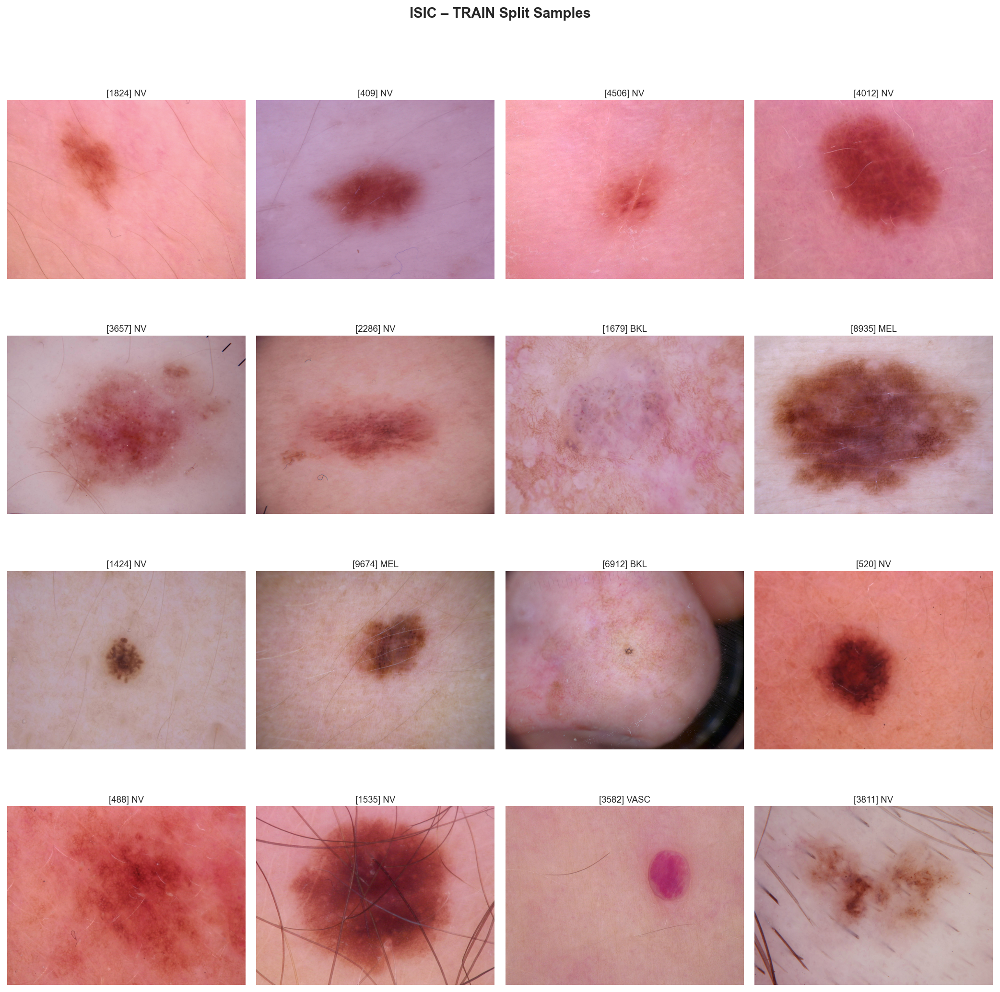


Displayed sample indices: [1824, 409, 4506, 4012, 3657, 2286, 1679, 8935, 1424, 9674, 6912, 520, 488, 1535, 3582, 3811]


In [37]:
"""
Display random samples from the training set.
"""

print("=" * 60)
print(f"TRAINING SET SAMPLES ({len(train_ds):,} total)")
print("=" * 60)

# Show random samples
sampled_indices = show_random_samples(
    dataset=train_ds,
    num_samples=NUM_SAMPLES_TO_SHOW,
    cols=4,
    figsize_per_image=3.5,
    random_state=RANDOM_SEED,
)

print(f"\nDisplayed sample indices: {sampled_indices}")

SAMPLES BY CLASS - TRAIN


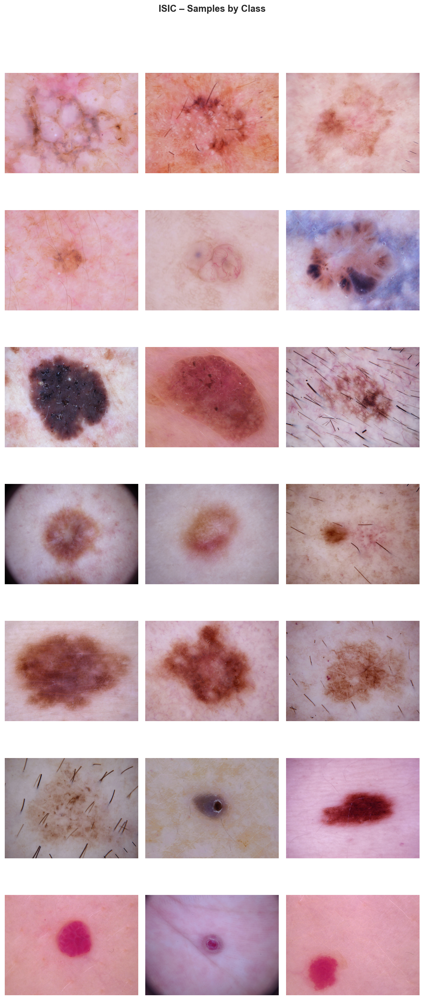


VALIDATION SET - SAMPLES BY CLASS


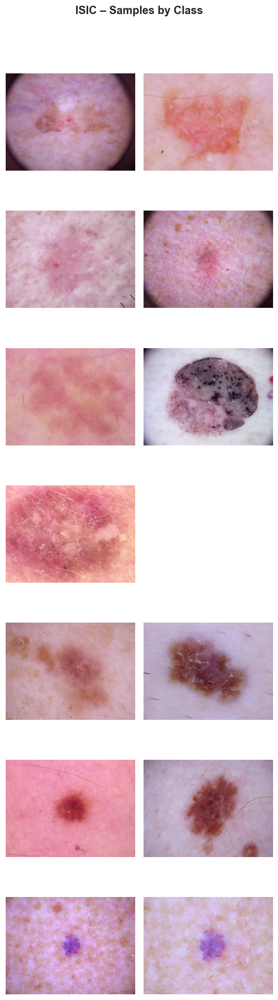

In [38]:
"""
Display sample images organized by class for train (and val if files exist).
Assumes:
- train_ds is the training dataset object
- datasets is a dict with optional "val" split
- show_class_samples is already defined
"""

print("=" * 60)
print("SAMPLES BY CLASS - TRAIN")
print("=" * 60)

# Train split (images are present)
show_class_samples(
    dataset=train_ds,
    samples_per_class=3,
    figsize_per_image=3.0,
)

# Validation split (only if files actually exist on disk)
val_ds = datasets.get("val", None)

if val_ds is not None and len(val_ds) > 0:
    val_summary = val_ds.validate(strict=False)

    print("\n" + "=" * 60)
    print("VALIDATION SET - SAMPLES BY CLASS")
    print("=" * 60)

    if not val_summary["is_valid"]:
        # Missing files: do not attempt to load images
        num_missing = val_summary["num_missing_files"]
        num_total = val_summary["num_samples"]
        print(
            f"Skipping validation visualization: {num_missing} / {num_total} files "
            f"are missing on this machine. "
            "Validation images cannot be displayed until the files exist."
        )
    else:
        # All good: show validation samples by class
        show_class_samples(
            dataset=val_ds,
            samples_per_class=2,
            figsize_per_image=2.5,
        )


In [39]:
"""
Functions for analyzing and visualizing class distributions.

These functions compute class statistics and create publication-quality
visualizations of class imbalance across dataset splits.
"""

# =============================================================================
# CLASS STATISTICS COMPUTATION
# =============================================================================

def compute_class_statistics(dataset: BaseMedicalDataset) -> Dict[str, Any]:
    """
    Compute comprehensive class distribution statistics.
    
    Parameters
    ----------
    dataset : BaseMedicalDataset
        Dataset to analyze
        
    Returns
    -------
    dict
        Dictionary containing:
        - class_names: list of str
        - class_counts: list of int
        - class_percentages: list of float
        - class_weights: list of float (inverse frequency)
        - total_samples: int
        - num_classes: int
        - imbalance_ratio: float (max/min)
        - majority_class: str
        - minority_class: str
    """
    class_names = dataset.class_names if hasattr(dataset, "class_names") else []
    num_classes = len(class_names) if class_names else dataset.num_classes
    
    # Initialize counts
    counts = np.zeros(num_classes, dtype=np.int64)
    
    # Count samples per class
    for sample in dataset.samples:
        label = sample.label
        
        # Single-label
        if label.ndim == 0 or (label.ndim == 1 and label.numel() == 1):
            class_idx = int(label.item())
            if class_idx < num_classes:
                counts[class_idx] += 1
        # Multi-label
        else:
            positive = (label > 0.5).nonzero(as_tuple=True)[0].tolist()
            for idx in positive:
                if idx < num_classes:
                    counts[idx] += 1
    
    total = int(counts.sum())
    
    # Calculate percentages
    percentages = (counts / total * 100) if total > 0 else np.zeros(num_classes)
    
    # Calculate class weights (inverse frequency)
    weights = np.zeros(num_classes, dtype=np.float32)
    for i, count in enumerate(counts):
        if count > 0:
            weights[i] = total / (num_classes * count)
        else:
            weights[i] = 0.0
    
    # Normalize weights
    if weights.sum() > 0:
        weights = weights / weights.sum() * num_classes
    
    # Imbalance metrics
    nonzero_counts = counts[counts > 0]
    if len(nonzero_counts) > 1:
        imbalance_ratio = float(nonzero_counts.max() / nonzero_counts.min())
    else:
        imbalance_ratio = 1.0
    
    # Find majority and minority classes
    if class_names:
        majority_idx = int(np.argmax(counts))
        minority_idx = int(np.argmin(counts[counts > 0])) if (counts > 0).any() else 0
        majority_class = class_names[majority_idx]
        minority_class = class_names[minority_idx]
    else:
        majority_class = f"Class {np.argmax(counts)}"
        minority_class = f"Class {np.argmin(counts[counts > 0])}"
    
    return {
        "class_names": class_names if class_names else [f"Class {i}" for i in range(num_classes)],
        "class_counts": counts.tolist(),
        "class_percentages": percentages.tolist(),
        "class_weights": weights.tolist(),
        "total_samples": total,
        "num_classes": num_classes,
        "imbalance_ratio": imbalance_ratio,
        "majority_class": majority_class,
        "minority_class": minority_class,
        "majority_count": int(counts.max()),
        "minority_count": int(nonzero_counts.min()) if len(nonzero_counts) > 0 else 0,
    }


# =============================================================================
# VISUALIZATION FUNCTIONS
# =============================================================================

def plot_class_distribution(
    stats: Dict[str, Any],
    split_name: str,
    figsize: Tuple[int, int] = (14, 5),
    color_palette: str = "husl",
    show_values: bool = True,
) -> None:
    """
    Plot class distribution as bar chart with detailed annotations.
    
    Parameters
    ----------
    stats : dict
        Statistics from compute_class_statistics()
    split_name : str
        Name of the split for title
    figsize : tuple
        Figure size (width, height)
    color_palette : str
        Seaborn color palette name
    show_values : bool
        Whether to show count and percentage labels on bars
    """
    class_names = stats["class_names"]
    counts = np.array(stats["class_counts"])
    percentages = np.array(stats["class_percentages"])
    num_classes = len(class_names)
    
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    # Color palette
    colors = sns.color_palette(color_palette, num_classes)
    
    # === BAR CHART ===
    x = np.arange(num_classes)
    bars = ax1.bar(x, counts, color=colors, edgecolor="black", linewidth=0.5)
    
    ax1.set_xticks(x)
    ax1.set_xticklabels(class_names, rotation=45, ha="right", fontsize=9)
    ax1.set_xlabel("Class", fontsize=10)
    ax1.set_ylabel("Sample Count", fontsize=10)
    ax1.set_title(f"{split_name} – Class Distribution", fontsize=12, fontweight="bold")
    
    # Add value labels on bars
    if show_values:
        for bar, count, pct in zip(bars, counts, percentages):
            height = bar.get_height()
            ax1.text(
                bar.get_x() + bar.get_width() / 2,
                height + counts.max() * 0.01,
                f"{int(count):,}\n({pct:.1f}%)",
                ha="center",
                va="bottom",
                fontsize=7,
            )
    
    ax1.set_ylim(0, counts.max() * 1.20)
    ax1.grid(axis="y", alpha=0.3)
    
    # === PIE CHART ===
    wedges, texts, autotexts = ax2.pie(
        counts,
        labels=None,
        autopct=lambda p: f"{p:.1f}%" if p > 3 else "",
        colors=colors,
        pctdistance=0.75,
        wedgeprops={"edgecolor": "white", "linewidth": 1},
    )
    
    # Adjust autotext font
    for autotext in autotexts:
        autotext.set_fontsize(8)
    
    ax2.set_title(f"Class Proportions (n={stats['total_samples']:,})", fontsize=12, fontweight="bold")
    
    # Legend
    ax2.legend(
        wedges,
        class_names,
        title="Classes",
        loc="center left",
        bbox_to_anchor=(1.0, 0.5),
        fontsize=8,
    )
    
    plt.tight_layout()
    plt.show()


def plot_cross_split_comparison(
    stats_by_split: Dict[str, Dict[str, Any]],
    figsize: Tuple[int, int] = (14, 6),
) -> None:
    """
    Compare class distributions across multiple splits.
    
    Parameters
    ----------
    stats_by_split : dict
        Dictionary mapping split names to their statistics
    figsize : tuple
        Figure size (width, height)
    """
    if len(stats_by_split) < 2:
        print("⚠️ Need at least 2 splits for comparison")
        return
    
    # Get class names from first split
    first_split = list(stats_by_split.keys())[0]
    class_names = stats_by_split[first_split]["class_names"]
    num_classes = len(class_names)
    
    # Prepare data
    splits = list(stats_by_split.keys())
    num_splits = len(splits)
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    x = np.arange(num_classes)
    width = 0.8 / num_splits
    
    colors = sns.color_palette("Set2", num_splits)
    
    # Plot bars for each split
    for i, (split, color) in enumerate(zip(splits, colors)):
        percentages = stats_by_split[split]["class_percentages"]
        offset = (i - num_splits / 2 + 0.5) * width
        
        bars = ax.bar(
            x + offset,
            percentages,
            width,
            label=split.upper(),
            color=color,
            edgecolor="black",
            linewidth=0.5,
        )
    
    ax.set_xlabel("Class", fontsize=11)
    ax.set_ylabel("Percentage (%)", fontsize=11)
    ax.set_title(
        f"{DATASET_KEY.upper()} – Class Distribution Comparison Across Splits",
        fontsize=13,
        fontweight="bold",
    )
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=45, ha="right", fontsize=9)
    ax.legend(title="Split", fontsize=9)
    ax.grid(axis="y", alpha=0.3)
    
    plt.tight_layout()
    plt.show()


def print_class_statistics(stats: Dict[str, Any], split_name: str) -> None:
    """
    Print formatted class statistics.
    
    Parameters
    ----------
    stats : dict
        Statistics from compute_class_statistics()
    split_name : str
        Name of the split
    """
    print(f"\n📊 {split_name.upper()} Split Statistics")
    print("=" * 50)
    print(f"Total samples:    {stats['total_samples']:,}")
    print(f"Number of classes: {stats['num_classes']}")
    print(f"Imbalance ratio:  {stats['imbalance_ratio']:.2f}x")
    print(f"Majority class:   {stats['majority_class']} ({stats['majority_count']:,} samples)")
    print(f"Minority class:   {stats['minority_class']} ({stats['minority_count']:,} samples)")
    
    # Warning for high imbalance
    if stats["imbalance_ratio"] > 10:
        print(f"⚠️  SEVERE imbalance detected (>{10}x)")
    elif stats["imbalance_ratio"] > 5:
        print(f"⚠️  Moderate imbalance detected (>{5}x)")
    
    # Create DataFrame for nice display
    df = pd.DataFrame({
        "Class": stats["class_names"],
        "Count": stats["class_counts"],
        "Percentage": [f"{p:.1f}%" for p in stats["class_percentages"]],
        "Weight": [f"{w:.3f}" for w in stats["class_weights"]],
    })
    df = df.sort_values("Count", ascending=False).reset_index(drop=True)
    
    print("\nClass breakdown:")
    print(df.to_string(index=False))


print("✅ Class distribution functions defined:")
print("   - compute_class_statistics(): Compute class counts and metrics")
print("   - plot_class_distribution(): Visualize single split distribution")
print("   - plot_cross_split_comparison(): Compare distributions across splits")
print("   - print_class_statistics(): Print formatted statistics table")

✅ Class distribution functions defined:
   - compute_class_statistics(): Compute class counts and metrics
   - plot_class_distribution(): Visualize single split distribution
   - plot_cross_split_comparison(): Compare distributions across splits
   - print_class_statistics(): Print formatted statistics table


CLASS DISTRIBUTION ANALYSIS – ISIC2018

📊 TRAIN Split Statistics
Total samples:    10,015
Number of classes: 7
Imbalance ratio:  58.30x
Majority class:   NV (6,705 samples)
Minority class:   DF (115 samples)
⚠️  SEVERE imbalance detected (>10x)

Class breakdown:
Class  Count Percentage Weight
   NV   6705      66.9%  0.046
  MEL   1113      11.1%  0.277
  BKL   1099      11.0%  0.281
  BCC    514       5.1%  0.600
AKIEC    327       3.3%  0.943
 VASC    142       1.4%  2.172
   DF    115       1.1%  2.682


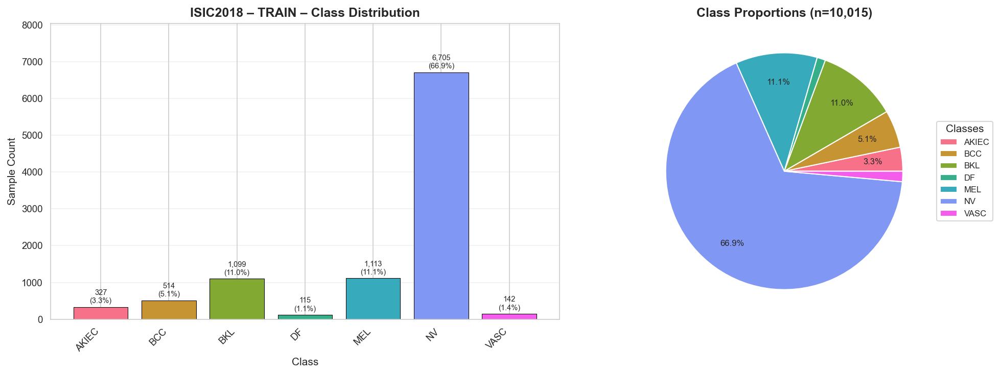


📊 VAL Split Statistics
Total samples:    193
Number of classes: 7
Imbalance ratio:  123.00x
Majority class:   NV (123 samples)
Minority class:   DF (1 samples)
⚠️  SEVERE imbalance detected (>10x)

Class breakdown:
Class  Count Percentage Weight
   NV    123      63.7%  0.035
  BKL     22      11.4%  0.196
  MEL     21      10.9%  0.205
  BCC     15       7.8%  0.287
AKIEC      8       4.1%  0.538
 VASC      3       1.6%  1.435
   DF      1       0.5%  4.305


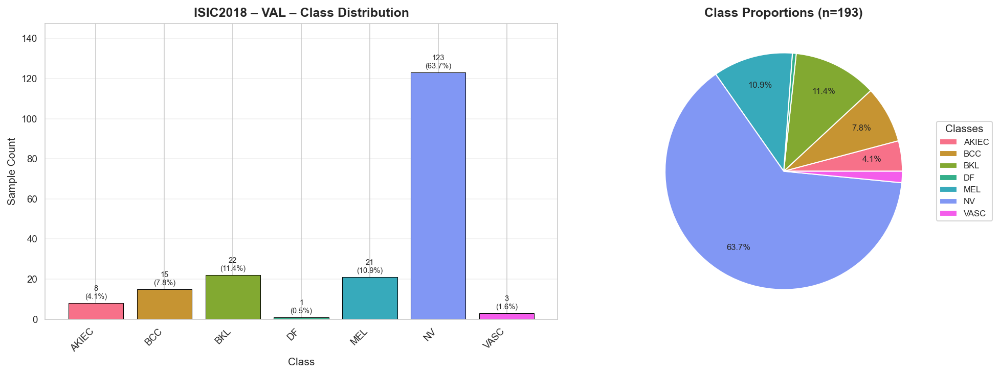


📊 TEST Split Statistics
Total samples:    1,512
Number of classes: 7
Imbalance ratio:  25.97x
Majority class:   NV (909 samples)
Minority class:   VASC (35 samples)
⚠️  SEVERE imbalance detected (>10x)

Class breakdown:
Class  Count Percentage Weight
   NV    909      60.1%  0.080
  BKL    217      14.4%  0.333
  MEL    171      11.3%  0.423
  BCC     93       6.2%  0.777
   DF     44       2.9%  1.642
AKIEC     43       2.8%  1.681
 VASC     35       2.3%  2.065


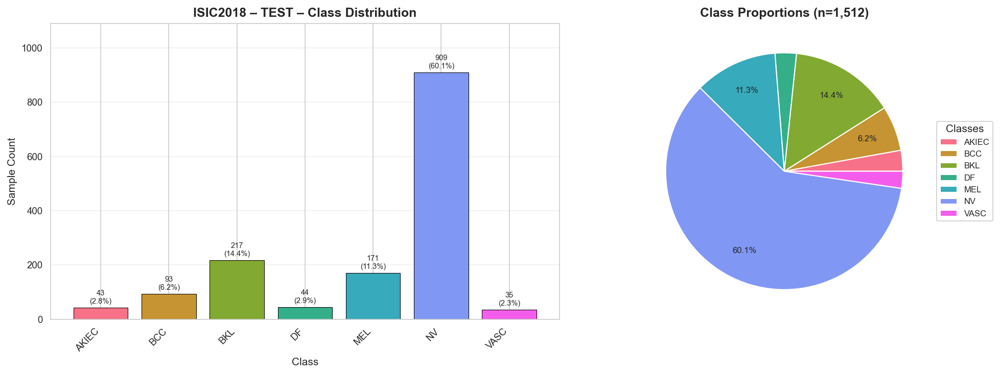


CROSS-SPLIT CLASS DISTRIBUTION COMPARISON


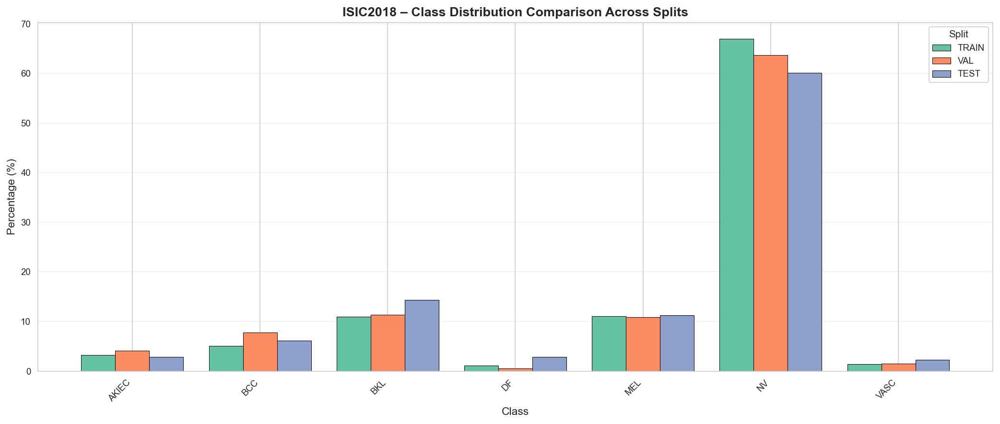


Detailed comparison table:
Class  Train (n) Train (%)  Val (n) Val (%)  Test (n) Test (%)
AKIEC        327      3.3%        8    4.1%        43     2.8%
  BCC        514      5.1%       15    7.8%        93     6.2%
  BKL       1099     11.0%       22   11.4%       217    14.4%
   DF        115      1.1%        1    0.5%        44     2.9%
  MEL       1113     11.1%       21   10.9%       171    11.3%
   NV       6705     66.9%      123   63.7%       909    60.1%
 VASC        142      1.4%        3    1.6%        35     2.3%

IMBALANCE ASSESSMENT & RECOMMENDATIONS

Training set imbalance ratio: 58.30x
  Majority: NV (6,705 samples)
  Minority: DF (115 samples)

📋 Recommendations:
  🔴 CRITICAL imbalance (>20x)
     → Use weighted loss (CrossEntropyLoss with class weights)
     → Apply aggressive oversampling (SMOTE or random oversampling)
     → Consider focal loss for hard examples
     → Use stratified sampling in DataLoader
     → Monitor per-class metrics (not just accuracy)

📊 Rec

In [40]:
"""
Analyze and visualize class distributions for all loaded splits.

This cell performs comprehensive class distribution analysis including:
- Per-split statistics computation
- Publication-quality visualizations
- Cross-split comparison
- Imbalance assessment and recommendations
"""

# =============================================================================
# COMPUTE CLASS STATISTICS FOR ALL SPLITS
# =============================================================================

print("=" * 80)
print(f"CLASS DISTRIBUTION ANALYSIS – {DATASET_KEY.upper()}")
print("=" * 80)

class_stats_by_split: Dict[str, Dict[str, Any]] = {}

for split_name, ds in datasets.items():
    # Skip if dataset is None or empty
    if ds is None:
        print(f"\n⚠️ Skipping '{split_name}' – dataset not loaded")
        continue
    if len(ds) == 0:
        print(f"\n⚠️ Skipping '{split_name}' – no samples found")
        continue
    
    # Compute statistics
    stats = compute_class_statistics(ds)
    class_stats_by_split[split_name] = stats
    
    # Print formatted summary
    print_class_statistics(stats, split_name=split_name)
    
    # Visualize distribution
    plot_class_distribution(
        stats=stats,
        split_name=f"{DATASET_KEY.upper()} – {split_name.upper()}",
        figsize=(14, 5),
        color_palette="husl",
        show_values=True,
    )

# =============================================================================
# CROSS-SPLIT COMPARISON
# =============================================================================

if len(class_stats_by_split) >= 2:
    print("\n" + "=" * 80)
    print("CROSS-SPLIT CLASS DISTRIBUTION COMPARISON")
    print("=" * 80)
    
    plot_cross_split_comparison(
        stats_by_split=class_stats_by_split,
        figsize=(14, 6),
    )
    
    # Create comparison table
    comparison_data = []
    class_names = class_stats_by_split[list(class_stats_by_split.keys())[0]]["class_names"]
    
    for class_name in class_names:
        row = {"Class": class_name}
        for split_name, stats in class_stats_by_split.items():
            idx = stats["class_names"].index(class_name)
            count = stats["class_counts"][idx]
            pct = stats["class_percentages"][idx]
            row[f"{split_name.title()} (n)"] = count
            row[f"{split_name.title()} (%)"] = f"{pct:.1f}%"
        comparison_data.append(row)
    
    comparison_df = pd.DataFrame(comparison_data)
    print("\nDetailed comparison table:")
    print(comparison_df.to_string(index=False))

else:
    print(f"\n⚠️ Need at least 2 splits for comparison (have: {list(class_stats_by_split.keys())})")

# =============================================================================
# IMBALANCE ASSESSMENT & RECOMMENDATIONS
# =============================================================================

print("\n" + "=" * 80)
print("IMBALANCE ASSESSMENT & RECOMMENDATIONS")
print("=" * 80)

if "train" in class_stats_by_split:
    train_stats = class_stats_by_split["train"]
    ratio = train_stats["imbalance_ratio"]
    
    print(f"\nTraining set imbalance ratio: {ratio:.2f}x")
    print(f"  Majority: {train_stats['majority_class']} ({train_stats['majority_count']:,} samples)")
    print(f"  Minority: {train_stats['minority_class']} ({train_stats['minority_count']:,} samples)")
    
    print("\n📋 Recommendations:")
    
    if ratio > 20:
        print("  🔴 CRITICAL imbalance (>20x)")
        print("     → Use weighted loss (CrossEntropyLoss with class weights)")
        print("     → Apply aggressive oversampling (SMOTE or random oversampling)")
        print("     → Consider focal loss for hard examples")
        print("     → Use stratified sampling in DataLoader")
        print("     → Monitor per-class metrics (not just accuracy)")
    elif ratio > 10:
        print("  🟠 SEVERE imbalance (>10x)")
        print("     → Use weighted loss function")
        print("     → Apply oversampling for minority classes")
        print("     → Consider class-balanced sampling")
        print("     → Report per-class precision/recall/F1")
    elif ratio > 5:
        print("  🟡 MODERATE imbalance (>5x)")
        print("     → Use class weights in loss function")
        print("     → Consider weighted random sampling")
        print("     → Monitor minority class performance")
    else:
        print("  🟢 Acceptable imbalance (≤5x)")
        print("     → Standard training should work well")
        print("     → Consider light class weighting for robustness")
    
    # Print recommended class weights
    print("\n📊 Recommended class weights for loss function:")
    weights_df = pd.DataFrame({
        "Class": train_stats["class_names"],
        "Count": train_stats["class_counts"],
        "Weight": [f"{w:.4f}" for w in train_stats["class_weights"]],
    }).sort_values("Count", ascending=True)
    print(weights_df.to_string(index=False))
    
    # Code snippet for PyTorch
    print("\n💻 PyTorch implementation:")
    weights_str = ", ".join([f"{w:.4f}" for w in train_stats["class_weights"]])
    print(f"    class_weights = torch.tensor([{weights_str}])")
    print("    criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))")

print("\n" + "=" * 80)

CLASS DISTRIBUTION ANALYSIS – ISIC2018

📊 TRAIN Split Statistics
Total samples:    10,015
Number of classes: 7
Imbalance ratio:  58.30x
Majority class:   NV (6,705 samples)
Minority class:   DF (115 samples)
⚠️  SEVERE imbalance detected (>10x)

Class breakdown:
Class  Count Percentage Weight
   NV   6705      66.9%  0.046
  MEL   1113      11.1%  0.277
  BKL   1099      11.0%  0.281
  BCC    514       5.1%  0.600
AKIEC    327       3.3%  0.943
 VASC    142       1.4%  2.172
   DF    115       1.1%  2.682


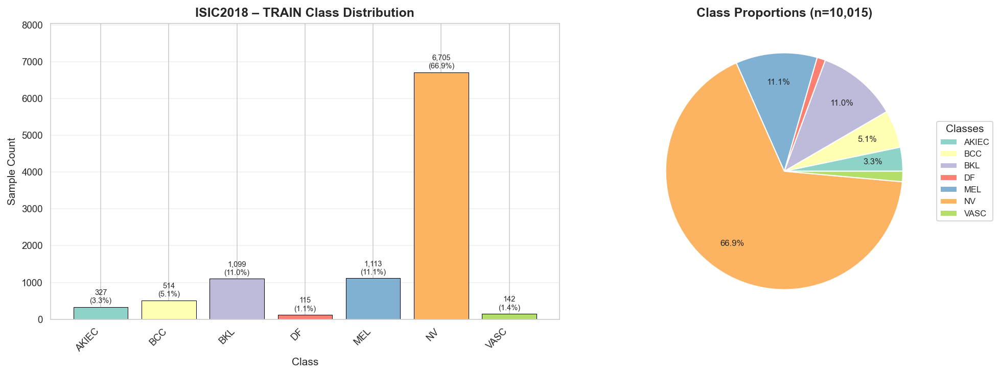


📊 VAL Split Statistics
Total samples:    193
Number of classes: 7
Imbalance ratio:  123.00x
Majority class:   NV (123 samples)
Minority class:   DF (1 samples)
⚠️  SEVERE imbalance detected (>10x)

Class breakdown:
Class  Count Percentage Weight
   NV    123      63.7%  0.035
  BKL     22      11.4%  0.196
  MEL     21      10.9%  0.205
  BCC     15       7.8%  0.287
AKIEC      8       4.1%  0.538
 VASC      3       1.6%  1.435
   DF      1       0.5%  4.305


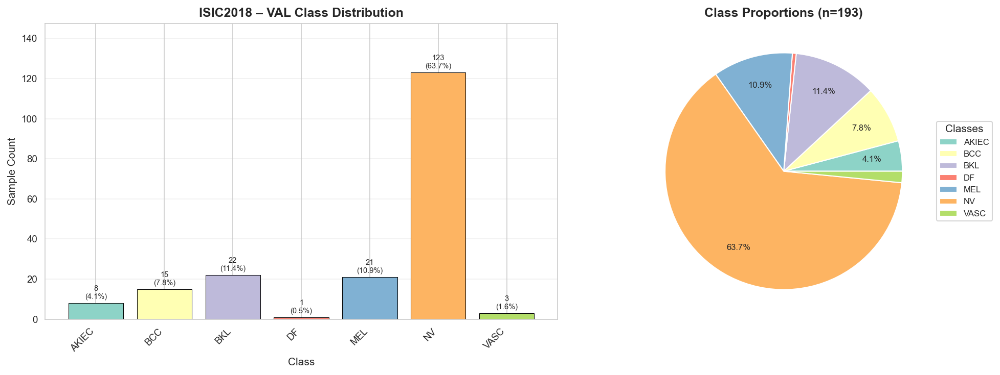


📊 TEST Split Statistics
Total samples:    1,512
Number of classes: 7
Imbalance ratio:  25.97x
Majority class:   NV (909 samples)
Minority class:   VASC (35 samples)
⚠️  SEVERE imbalance detected (>10x)

Class breakdown:
Class  Count Percentage Weight
   NV    909      60.1%  0.080
  BKL    217      14.4%  0.333
  MEL    171      11.3%  0.423
  BCC     93       6.2%  0.777
   DF     44       2.9%  1.642
AKIEC     43       2.8%  1.681
 VASC     35       2.3%  2.065


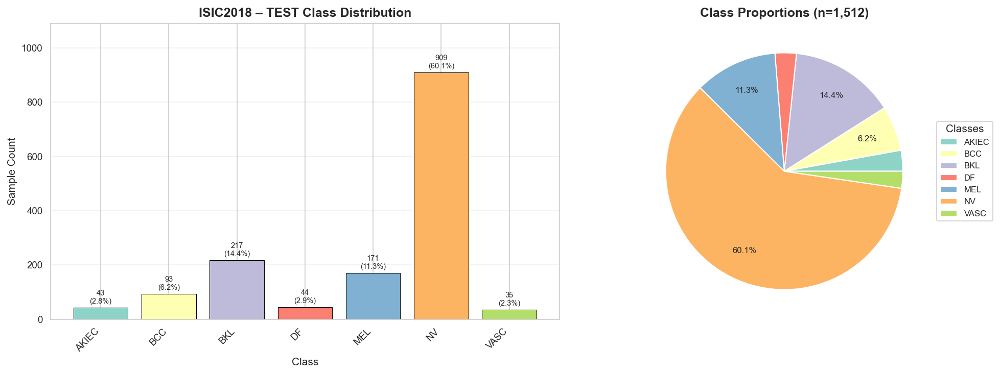


CROSS-SPLIT CLASS DISTRIBUTION COMPARISON


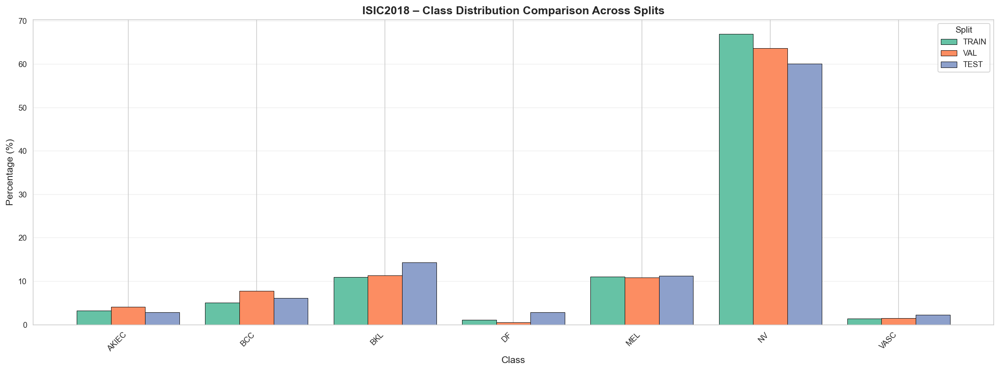


Saved figures to: C:\Users\Dissertation\tri-objective-robust-xai-medimg\notebooks\docs\figures\data\isic2018


In [41]:
# CELL: Generate and save publication-ready class distribution figures
from pathlib import Path
from typing import Dict, Any

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display

# Where to save figures
FIG_DIR = Path("docs/figures/data") / DATASET_KEY.lower()
FIG_DIR.mkdir(parents=True, exist_ok=True)

print("=" * 70)
print(f"CLASS DISTRIBUTION ANALYSIS – {DATASET_KEY.upper()}")
print("=" * 70)

stats_by_split: Dict[str, Dict[str, Any]] = {}

# ---------------------------------------------------------------------
# 1) Per-split stats + bar/pie figures
# ---------------------------------------------------------------------
for split_name in ["train", "val", "test"]:
    if split_name not in datasets:
        continue

    ds = datasets[split_name]

    # Compute statistics
    stats = compute_class_statistics(ds)
    stats_by_split[split_name] = stats

    # Text summary (uses the helper we already defined)
    print_class_statistics(stats, split_name)

    # ----- figure (bar + pie) -----
    # Build the figure explicitly here so we always save the right one.
    class_names = stats["class_names"]
    counts = np.array(stats["class_counts"])
    percentages = np.array(stats["class_percentages"])
    num_classes = len(class_names)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

    # Colour palette
    colors = sns.color_palette("Set3", num_classes)

    # BAR CHART
    x = np.arange(num_classes)
    bars = ax1.bar(x, counts, color=colors, edgecolor="black", linewidth=0.5)

    ax1.set_xticks(x)
    ax1.set_xticklabels(class_names, rotation=45, ha="right", fontsize=9)
    ax1.set_xlabel("Class", fontsize=10)
    ax1.set_ylabel("Sample Count", fontsize=10)
    ax1.set_title(
        f"{DATASET_KEY.upper()} – {split_name.upper()} Class Distribution",
        fontsize=12,
        fontweight="bold",
    )

    for bar, count, pct in zip(bars, counts, percentages):
        height = bar.get_height()
        ax1.text(
            bar.get_x() + bar.get_width() / 2,
            height + counts.max() * 0.01,
            f"{int(count):,}\n({pct:.1f}%)",
            ha="center",
            va="bottom",
            fontsize=7,
        )

    ax1.set_ylim(0, counts.max() * 1.20)
    ax1.grid(axis="y", alpha=0.3)

    # PIE CHART
    wedges, _, autotexts = ax2.pie(
        counts,
        labels=None,
        autopct=lambda p: f"{p:.1f}%" if p > 3 else "",
        colors=colors,
        pctdistance=0.75,
        wedgeprops={"edgecolor": "white", "linewidth": 1},
    )
    for autotext in autotexts:
        autotext.set_fontsize(8)

    ax2.set_title(
        f"Class Proportions (n={stats['total_samples']:,})",
        fontsize=12,
        fontweight="bold",
    )
    ax2.legend(
        wedges,
        class_names,
        title="Classes",
        loc="center left",
        bbox_to_anchor=(1.0, 0.5),
        fontsize=8,
    )

    plt.tight_layout()

    # Display in notebook
    display(fig)

    # Save high-resolution PNG + PDF
    base_name = f"{DATASET_KEY.lower()}_{split_name}_class_distribution"
    fig.savefig(FIG_DIR / f"{base_name}.png", dpi=300, bbox_inches="tight")
    fig.savefig(FIG_DIR / f"{base_name}.pdf", dpi=300, bbox_inches="tight")
    plt.close(fig)

# ---------------------------------------------------------------------
# 2) Cross-split comparison figure (only if we have ≥ 2 splits)
# ---------------------------------------------------------------------
if len(stats_by_split) >= 2:
    print("\n" + "=" * 70)
    print("CROSS-SPLIT CLASS DISTRIBUTION COMPARISON")
    print("=" * 70)

    # Use TRAIN's order as canonical
    first_split = list(stats_by_split.keys())[0]
    class_names = stats_by_split[first_split]["class_names"]
    num_classes = len(class_names)

    splits = list(stats_by_split.keys())
    num_splits = len(splits)

    x = np.arange(num_classes)
    width = 0.8 / num_splits
    colors = sns.color_palette("Set2", num_splits)

    fig, ax = plt.subplots(figsize=(16, 6))

    for i, (split, color) in enumerate(zip(splits, colors)):
        percentages = np.array(stats_by_split[split]["class_percentages"])
        offset = (i - num_splits / 2 + 0.5) * width
        ax.bar(
            x + offset,
            percentages,
            width,
            label=split.upper(),
            color=color,
            edgecolor="black",
            linewidth=0.5,
        )

    ax.set_xlabel("Class", fontsize=11)
    ax.set_ylabel("Percentage (%)", fontsize=11)
    ax.set_title(
        f"{DATASET_KEY.upper()} – Class Distribution Comparison Across Splits",
        fontsize=13,
        fontweight="bold",
    )
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=45, ha="right", fontsize=9)
    ax.legend(title="Split", fontsize=9)
    ax.grid(axis="y", alpha=0.3)

    plt.tight_layout()

    # Display in notebook
    display(fig)

    # Save PNG + PDF for the cross-split comparison
    base_name = f"{DATASET_KEY.lower()}_cross_split_class_distribution"
    fig.savefig(FIG_DIR / f"{base_name}.png", dpi=300, bbox_inches="tight")
    fig.savefig(FIG_DIR / f"{base_name}.pdf", dpi=300, bbox_inches="tight")
    plt.close(fig)

print(f"\nSaved figures to: {FIG_DIR.resolve()}")


In [42]:
"""
Comprehensive image property analysis with publication-ready visualizations.

This cell provides advanced analysis of image properties including:
- Dimensions, aspect ratios, and file sizes
- Pixel intensity statistics and distributions
- Channel and format analysis
- Outlier detection and data quality assessment
- Correlation analysis between image properties
- Automatic figure generation and saving

All outputs are suitable for dissertation methodology chapter.
"""

from pathlib import Path
from typing import Dict, List, Optional, Any, Tuple
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats as scipy_stats
from tqdm.auto import tqdm
from PIL import Image, UnidentifiedImageError

# =============================================================================
# CONFIGURATION
# =============================================================================

# Analysis parameters
MAX_IMAGES_FOR_STATS: Optional[int] = 500  # Set to None for all images
OUTLIER_THRESHOLD_STD: float = 3.0  # Standard deviations for outlier detection

# Output directories
IMG_STATS_FIG_DIR = PROJECT_ROOT / "docs" / "figures" / "data" / DATASET_KEY.lower() / "image_stats"
IMG_STATS_TABLE_DIR = PROJECT_ROOT / "docs" / "tables" / "data" / DATASET_KEY.lower() / "image_stats"

IMG_STATS_FIG_DIR.mkdir(parents=True, exist_ok=True)
IMG_STATS_TABLE_DIR.mkdir(parents=True, exist_ok=True)

# =============================================================================
# CORE ANALYSIS FUNCTION
# =============================================================================

def analyze_image_properties(
    dataset: BaseMedicalDataset,
    split_name: str,
    max_images: Optional[int] = None,
    random_sample: bool = True,
) -> pd.DataFrame:
    """
    Perform comprehensive image property analysis for a dataset split.
    
    Parameters
    ----------
    dataset : BaseMedicalDataset
        Dataset to analyze
    split_name : str
        Name of the split for reporting
    max_images : int, optional
        Maximum images to analyze (None for all)
    random_sample : bool
        If True, randomly sample images; otherwise take first N
        
    Returns
    -------
    pd.DataFrame
        DataFrame with columns:
        - index: dataset index
        - split: split name
        - width, height: image dimensions
        - aspect_ratio: width/height
        - file_size_kb: file size in KB
        - channels: number of channels
        - extension: file extension
        - pixel_mean: mean pixel intensity
        - pixel_std: standard deviation of pixel intensity
        - pixel_min, pixel_max: intensity range
        - is_square: whether image is square
        - megapixels: total pixels in millions
    """
    n_total = len(dataset)
    n_analyze = n_total if max_images is None else min(n_total, max_images)
    
    # Select indices
    if random_sample and max_images is not None and max_images < n_total:
        indices = random.sample(range(n_total), n_analyze)
    else:
        indices = list(range(n_analyze))
    
    records: List[Dict[str, Any]] = []
    errors: List[Dict[str, Any]] = []
    
    # Progress bar
    pbar = tqdm(
        indices,
        desc=f"Analyzing {split_name}",
        unit="img",
        leave=True,
    )
    
    for idx in pbar:
        try:
            # Get sample info
            sample = dataset.samples[idx]
            img_path = sample.image_path
            
            # Handle relative paths
            if not img_path.is_absolute():
                img_path = dataset.root / img_path
            
            # Initialize record
            record = {
                "index": idx,
                "split": split_name,
                "width": 0,
                "height": 0,
                "aspect_ratio": 0.0,
                "file_size_kb": 0.0,
                "channels": 0,
                "extension": img_path.suffix.lower() if img_path.suffix else "unknown",
                "pixel_mean": 0.0,
                "pixel_std": 0.0,
                "pixel_min": 0.0,
                "pixel_max": 0.0,
                "is_square": False,
                "megapixels": 0.0,
            }
            
            # File size
            if img_path.exists():
                record["file_size_kb"] = img_path.stat().st_size / 1024.0
            else:
                errors.append({"index": idx, "path": str(img_path), "error": "File not found"})
                continue
            
            # Load image using dataset's method
            img_array = dataset._load_image(img_path)
            
            # Dimensions
            if img_array.ndim == 2:
                h, w = img_array.shape
                c = 1
            elif img_array.ndim == 3:
                h, w, c = img_array.shape
            else:
                raise ValueError(f"Unexpected shape: {img_array.shape}")
            
            record["width"] = w
            record["height"] = h
            record["channels"] = c
            record["aspect_ratio"] = w / h if h > 0 else 0.0
            record["is_square"] = abs(w - h) <= 1
            record["megapixels"] = (w * h) / 1_000_000
            
            # Pixel statistics
            img_float = img_array.astype(np.float32)
            record["pixel_mean"] = float(np.mean(img_float))
            record["pixel_std"] = float(np.std(img_float))
            record["pixel_min"] = float(np.min(img_float))
            record["pixel_max"] = float(np.max(img_float))
            
            records.append(record)
            
        except (FileNotFoundError, UnidentifiedImageError, OSError, ValueError) as e:
            errors.append({"index": idx, "path": str(img_path) if 'img_path' in dir() else "unknown", "error": str(e)})
            continue
        except Exception as e:
            errors.append({"index": idx, "path": "unknown", "error": f"Unexpected: {str(e)}"})
            continue
    
    pbar.close()
    
    # Create DataFrame
    df = pd.DataFrame.from_records(records)
    
    # Report errors
    if errors:
        print(f"\n⚠️ Encountered {len(errors)} errors during analysis:")
        for err in errors[:5]:
            print(f"   idx={err['index']}: {err['error']}")
        if len(errors) > 5:
            print(f"   ... and {len(errors) - 5} more")
    
    return df


# =============================================================================
# STATISTICAL SUMMARY FUNCTION
# =============================================================================

def compute_detailed_statistics(df: pd.DataFrame) -> Dict[str, Any]:
    """
    Compute comprehensive statistics from image property DataFrame.
    
    Parameters
    ----------
    df : pd.DataFrame
        DataFrame from analyze_image_properties()
        
    Returns
    -------
    dict
        Nested dictionary with statistics for each property
    """
    if df.empty:
        return {}
    
    stats = {}
    
    # Numerical columns to analyze
    num_cols = ["width", "height", "aspect_ratio", "file_size_kb", 
                "pixel_mean", "pixel_std", "megapixels"]
    
    for col in num_cols:
        if col not in df.columns:
            continue
            
        data = df[col].dropna()
        if len(data) == 0:
            continue
        
        # Basic statistics
        col_stats = {
            "count": len(data),
            "min": float(data.min()),
            "max": float(data.max()),
            "mean": float(data.mean()),
            "std": float(data.std()),
            "median": float(data.median()),
            "q1": float(data.quantile(0.25)),
            "q3": float(data.quantile(0.75)),
            "iqr": float(data.quantile(0.75) - data.quantile(0.25)),
        }
        
        # Skewness and kurtosis
        if len(data) > 2:
            col_stats["skewness"] = float(scipy_stats.skew(data))
            col_stats["kurtosis"] = float(scipy_stats.kurtosis(data))
        
        # Outlier detection
        lower_bound = col_stats["q1"] - 1.5 * col_stats["iqr"]
        upper_bound = col_stats["q3"] + 1.5 * col_stats["iqr"]
        outliers = data[(data < lower_bound) | (data > upper_bound)]
        col_stats["n_outliers"] = len(outliers)
        col_stats["outlier_pct"] = len(outliers) / len(data) * 100
        
        stats[col] = col_stats
    
    # Categorical statistics
    if "channels" in df.columns:
        stats["channels"] = dict(df["channels"].value_counts())
    
    if "extension" in df.columns:
        stats["extension"] = dict(df["extension"].value_counts())
    
    if "is_square" in df.columns:
        stats["square_images"] = int(df["is_square"].sum())
        stats["square_pct"] = df["is_square"].mean() * 100
    
    return stats


def print_detailed_statistics(
    df: pd.DataFrame,
    split_name: str,
    stats: Optional[Dict[str, Any]] = None,
) -> None:
    """
    Print comprehensive statistics in formatted output.
    
    Parameters
    ----------
    df : pd.DataFrame
        Image properties DataFrame
    split_name : str
        Name of the split
    stats : dict, optional
        Pre-computed statistics (computed if not provided)
    """
    if df.empty:
        print(f"❌ No data for {split_name}")
        return
    
    if stats is None:
        stats = compute_detailed_statistics(df)
    
    print(f"\n{'='*70}")
    print(f"📷 IMAGE PROPERTY STATISTICS – {split_name.upper()}")
    print(f"{'='*70}")
    print(f"Images analyzed: {len(df):,}")
    
    # Dimensions
    print(f"\n📐 DIMENSIONS")
    print("-" * 50)
    for prop in ["width", "height"]:
        if prop in stats:
            s = stats[prop]
            print(f"  {prop.title():8s}: "
                  f"min={s['min']:.0f}, max={s['max']:.0f}, "
                  f"mean={s['mean']:.1f}±{s['std']:.1f}, "
                  f"median={s['median']:.0f}")
    
    if "aspect_ratio" in stats:
        s = stats["aspect_ratio"]
        print(f"  {'Aspect':8s}: "
              f"min={s['min']:.2f}, max={s['max']:.2f}, "
              f"mean={s['mean']:.2f}±{s['std']:.2f}")
    
    if "megapixels" in stats:
        s = stats["megapixels"]
        print(f"  {'Size':8s}: "
              f"min={s['min']:.2f}MP, max={s['max']:.2f}MP, "
              f"mean={s['mean']:.2f}MP")
    
    # File properties
    print(f"\n📁 FILE PROPERTIES")
    print("-" * 50)
    if "file_size_kb" in stats:
        s = stats["file_size_kb"]
        print(f"  Size (KB): "
              f"min={s['min']:.1f}, max={s['max']:.1f}, "
              f"mean={s['mean']:.1f}±{s['std']:.1f}")
    
    if "extension" in stats:
        ext_str = ", ".join([f"{k}: {v}" for k, v in stats["extension"].items()])
        print(f"  Extensions: {ext_str}")
    
    if "channels" in stats:
        ch_str = ", ".join([f"{k}ch: {v}" for k, v in stats["channels"].items()])
        print(f"  Channels: {ch_str}")
    
    # Pixel statistics
    print(f"\n🎨 PIXEL INTENSITY")
    print("-" * 50)
    for prop in ["pixel_mean", "pixel_std"]:
        if prop in stats:
            s = stats[prop]
            label = "Mean" if "mean" in prop else "Std"
            print(f"  {label:8s}: "
                  f"min={s['min']:.1f}, max={s['max']:.1f}, "
                  f"mean={s['mean']:.1f}±{s['std']:.1f}")
    
    # Data quality
    print(f"\n🔍 DATA QUALITY")
    print("-" * 50)
    if "square_pct" in stats:
        print(f"  Square images: {stats['square_images']:,} ({stats['square_pct']:.1f}%)")
    
    # Outliers
    outlier_cols = ["width", "height", "file_size_kb"]
    for col in outlier_cols:
        if col in stats and stats[col].get("n_outliers", 0) > 0:
            print(f"  {col.title()} outliers: {stats[col]['n_outliers']} ({stats[col]['outlier_pct']:.1f}%)")


# =============================================================================
# VISUALIZATION FUNCTIONS
# =============================================================================

def plot_image_property_analysis(
    df: pd.DataFrame,
    split_name: str,
    save_dir: Optional[Path] = None,
    figsize: Tuple[int, int] = (16, 12),
) -> None:
    """
    Create comprehensive visualization of image properties.
    
    Parameters
    ----------
    df : pd.DataFrame
        Image properties DataFrame
    split_name : str
        Name of the split
    save_dir : Path, optional
        Directory to save figures
    figsize : tuple
        Figure size
    """
    if df.empty:
        print(f"❌ No data to plot for {split_name}")
        return
    
    # Create figure
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(3, 3, hspace=0.35, wspace=0.3)
    
    # === 1. Dimension Scatter Plot ===
    ax1 = fig.add_subplot(gs[0, 0])
    scatter = ax1.scatter(
        df["width"], df["height"],
        s=20, alpha=0.5, c=df["file_size_kb"],
        cmap="viridis", edgecolors="none"
    )
    ax1.set_xlabel("Width (pixels)", fontsize=10)
    ax1.set_ylabel("Height (pixels)", fontsize=10)
    ax1.set_title("Image Dimensions", fontsize=11, fontweight="bold")
    
    # Add diagonal for square images
    max_dim = max(df["width"].max(), df["height"].max())
    ax1.plot([0, max_dim], [0, max_dim], "r--", alpha=0.5, linewidth=1, label="Square")
    ax1.legend(loc="lower right", fontsize=8)
    ax1.grid(True, alpha=0.3)
    
    # Colorbar
    cbar = plt.colorbar(scatter, ax=ax1, pad=0.02)
    cbar.set_label("File Size (KB)", fontsize=8)
    cbar.ax.tick_params(labelsize=7)
    
    # === 2. Dimension Histograms ===
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.hist(df["width"], bins=50, alpha=0.6, label="Width", color="#4477AA", edgecolor="black", linewidth=0.5)
    ax2.hist(df["height"], bins=50, alpha=0.6, label="Height", color="#EE6677", edgecolor="black", linewidth=0.5)
    ax2.set_xlabel("Pixels", fontsize=10)
    ax2.set_ylabel("Frequency", fontsize=10)
    ax2.set_title("Dimension Distribution", fontsize=11, fontweight="bold")
    ax2.legend(fontsize=8)
    ax2.grid(True, alpha=0.3)
    
    # === 3. Aspect Ratio Distribution ===
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.hist(df["aspect_ratio"], bins=50, color="#228833", alpha=0.7, edgecolor="black", linewidth=0.5)
    ax3.axvline(x=1.0, color="red", linestyle="--", linewidth=1.5, label="Square (1.0)")
    ax3.set_xlabel("Aspect Ratio (W/H)", fontsize=10)
    ax3.set_ylabel("Frequency", fontsize=10)
    ax3.set_title("Aspect Ratio Distribution", fontsize=11, fontweight="bold")
    ax3.legend(fontsize=8)
    ax3.grid(True, alpha=0.3)
    
    # === 4. File Size Distribution ===
    ax4 = fig.add_subplot(gs[1, 0])
    ax4.hist(df["file_size_kb"], bins=50, color="#AA3377", alpha=0.7, edgecolor="black", linewidth=0.5)
    ax4.set_xlabel("File Size (KB)", fontsize=10)
    ax4.set_ylabel("Frequency", fontsize=10)
    ax4.set_title("File Size Distribution", fontsize=11, fontweight="bold")
    ax4.grid(True, alpha=0.3)
    
    # Add statistics annotation
    mean_size = df["file_size_kb"].mean()
    median_size = df["file_size_kb"].median()
    ax4.axvline(mean_size, color="red", linestyle="-", alpha=0.8, label=f"Mean: {mean_size:.1f}")
    ax4.axvline(median_size, color="blue", linestyle="--", alpha=0.8, label=f"Median: {median_size:.1f}")
    ax4.legend(fontsize=7, loc="upper right")
    
    # === 5. Pixel Mean Distribution ===
    ax5 = fig.add_subplot(gs[1, 1])
    ax5.hist(df["pixel_mean"], bins=50, color="#CCBB44", alpha=0.7, edgecolor="black", linewidth=0.5)
    ax5.set_xlabel("Mean Pixel Intensity", fontsize=10)
    ax5.set_ylabel("Frequency", fontsize=10)
    ax5.set_title("Pixel Mean Distribution", fontsize=11, fontweight="bold")
    ax5.grid(True, alpha=0.3)
    
    # === 6. Pixel Std Distribution ===
    ax6 = fig.add_subplot(gs[1, 2])
    ax6.hist(df["pixel_std"], bins=50, color="#66CCEE", alpha=0.7, edgecolor="black", linewidth=0.5)
    ax6.set_xlabel("Pixel Intensity Std", fontsize=10)
    ax6.set_ylabel("Frequency", fontsize=10)
    ax6.set_title("Pixel Std Distribution", fontsize=11, fontweight="bold")
    ax6.grid(True, alpha=0.3)
    
    # === 7. Width vs File Size ===
    ax7 = fig.add_subplot(gs[2, 0])
    ax7.scatter(df["width"] * df["height"] / 1e6, df["file_size_kb"], s=15, alpha=0.5, c="#4477AA")
    ax7.set_xlabel("Megapixels", fontsize=10)
    ax7.set_ylabel("File Size (KB)", fontsize=10)
    ax7.set_title("Resolution vs File Size", fontsize=11, fontweight="bold")
    ax7.grid(True, alpha=0.3)
    
    # === 8. Channel Distribution ===
    ax8 = fig.add_subplot(gs[2, 1])
    channel_counts = df["channels"].value_counts().sort_index()
    colors = ["#BBBBBB", "#228833", "#4477AA"][:len(channel_counts)]
    bars = ax8.bar(channel_counts.index.astype(str), channel_counts.values, color=colors, edgecolor="black", linewidth=0.5)
    ax8.set_xlabel("Number of Channels", fontsize=10)
    ax8.set_ylabel("Count", fontsize=10)
    ax8.set_title("Channel Distribution", fontsize=11, fontweight="bold")
    ax8.grid(axis="y", alpha=0.3)
    
    # Add value labels
    for bar in bars:
        height = bar.get_height()
        ax8.text(bar.get_x() + bar.get_width()/2, height, f"{int(height):,}",
                 ha="center", va="bottom", fontsize=8)
    
    # === 9. Extension Distribution ===
    ax9 = fig.add_subplot(gs[2, 2])
    ext_counts = df["extension"].value_counts()
    colors = sns.color_palette("pastel", len(ext_counts))
    wedges, texts, autotexts = ax9.pie(
        ext_counts.values, labels=ext_counts.index,
        autopct="%1.1f%%", colors=colors,
        wedgeprops={"edgecolor": "white", "linewidth": 1}
    )
    for autotext in autotexts:
        autotext.set_fontsize(8)
    ax9.set_title("File Extensions", fontsize=11, fontweight="bold")
    
    # Main title
    fig.suptitle(
        f"{DATASET_KEY.upper()} – {split_name.upper()} – Image Property Analysis",
        fontsize=14, fontweight="bold", y=1.02
    )
    
    plt.tight_layout()
    plt.show()
    
    # Save figure
    if save_dir:
        base_name = f"{DATASET_KEY.lower()}_{split_name}_image_properties"
        for fmt in ["png", "pdf"]:
            filepath = save_dir / f"{base_name}.{fmt}"
            fig.savefig(filepath, dpi=300, bbox_inches="tight", facecolor="white")
        print(f"   ✅ Saved: {base_name}.[png|pdf]")
    
    plt.close(fig)


print("✅ Image property analysis functions defined:")
print("   - analyze_image_properties(): Gather comprehensive image metadata")
print("   - compute_detailed_statistics(): Calculate statistical summaries")
print("   - print_detailed_statistics(): Display formatted statistics")
print("   - plot_image_property_analysis(): Create publication-ready visualizations")

✅ Image property analysis functions defined:
   - analyze_image_properties(): Gather comprehensive image metadata
   - compute_detailed_statistics(): Calculate statistical summaries
   - print_detailed_statistics(): Display formatted statistics
   - plot_image_property_analysis(): Create publication-ready visualizations


IMAGE PROPERTY ANALYSIS – ISIC2018

ANALYZING TRAIN SPLIT


Analyzing train:   0%|          | 0/500 [00:00<?, ?img/s]

Analyzing train: 100%|██████████| 500/500 [00:11<00:00, 43.01img/s]
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:239: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["skewness"] = float(scipy_stats.skew(data))
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:240: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["kurtosis"] = float(scipy_stats.kurtosis(data))
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:239: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["skewness"] = float(scipy_stats.skew(data))
C:\Users\Viraj Jain\AppDa


📷 IMAGE PROPERTY STATISTICS – TRAIN
Images analyzed: 500

📐 DIMENSIONS
--------------------------------------------------
  Width   : min=600, max=600, mean=600.0±0.0, median=600
  Height  : min=450, max=450, mean=450.0±0.0, median=450
  Aspect  : min=1.33, max=1.33, mean=1.33±0.00
  Size    : min=0.27MP, max=0.27MP, mean=0.27MP

📁 FILE PROPERTIES
--------------------------------------------------
  Size (KB): min=120.0, max=386.3, mean=269.8±44.3
  Extensions: .jpg: 500
  Channels: 3ch: 500

🎨 PIXEL INTENSITY
--------------------------------------------------
  Mean    : min=109.9, max=221.1, mean=159.7±19.0
  Std     : min=15.2, max=66.9, mean=40.5±11.4

🔍 DATA QUALITY
--------------------------------------------------
  Square images: 0 (0.0%)
  File_Size_Kb outliers: 25 (5.0%)


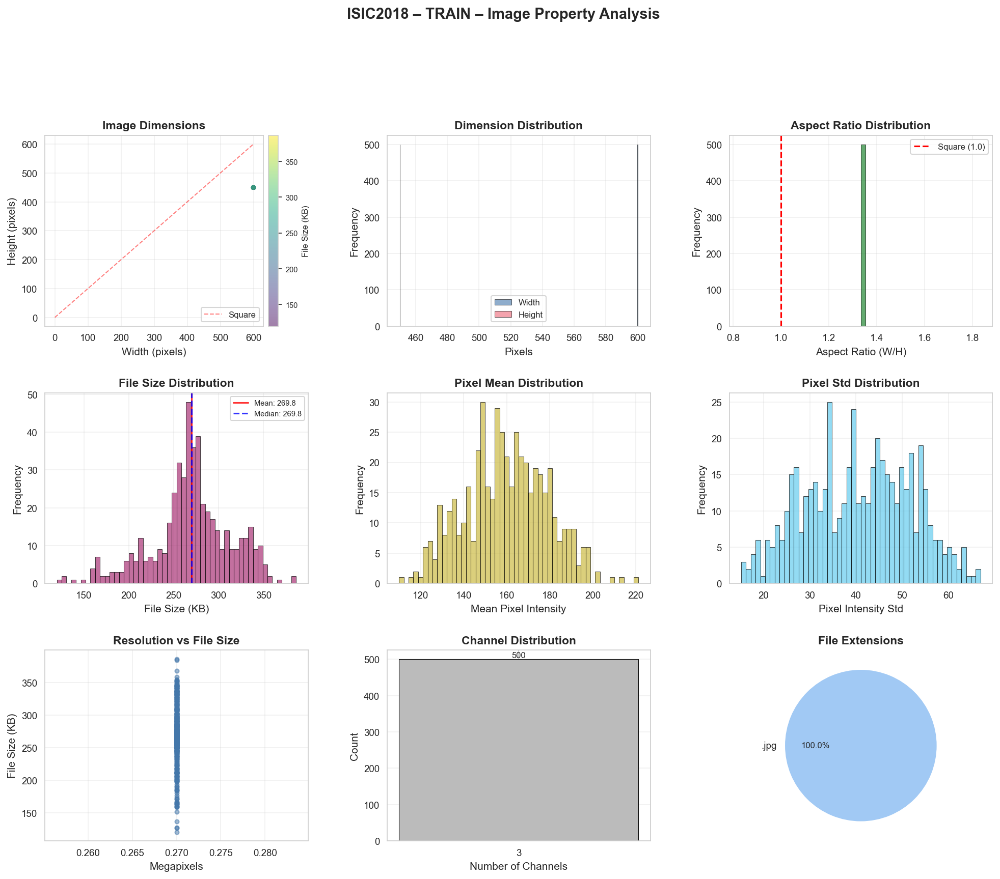

   ✅ Saved: isic2018_train_image_properties.[png|pdf]
   ✅ Saved data: isic2018_train_image_properties.csv

ANALYZING VAL SPLIT


Analyzing val: 100%|██████████| 193/193 [00:03<00:00, 57.39img/s]
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:239: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["skewness"] = float(scipy_stats.skew(data))
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:240: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["kurtosis"] = float(scipy_stats.kurtosis(data))
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:239: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["skewness"] = float(scipy_stats.skew(data))
C:\Users\Viraj Jain\AppData


📷 IMAGE PROPERTY STATISTICS – VAL
Images analyzed: 193

📐 DIMENSIONS
--------------------------------------------------
  Width   : min=600, max=600, mean=600.0±0.0, median=600
  Height  : min=450, max=450, mean=450.0±0.0, median=450
  Aspect  : min=1.33, max=1.33, mean=1.33±0.00
  Size    : min=0.27MP, max=0.27MP, mean=0.27MP

📁 FILE PROPERTIES
--------------------------------------------------
  Size (KB): min=109.4, max=409.9, mean=269.5±43.2
  Extensions: .jpg: 193
  Channels: 3ch: 193

🎨 PIXEL INTENSITY
--------------------------------------------------
  Mean    : min=123.5, max=222.0, mean=161.7±17.1
  Std     : min=11.4, max=67.7, mean=39.4±11.6

🔍 DATA QUALITY
--------------------------------------------------
  Square images: 0 (0.0%)
  File_Size_Kb outliers: 17 (8.8%)


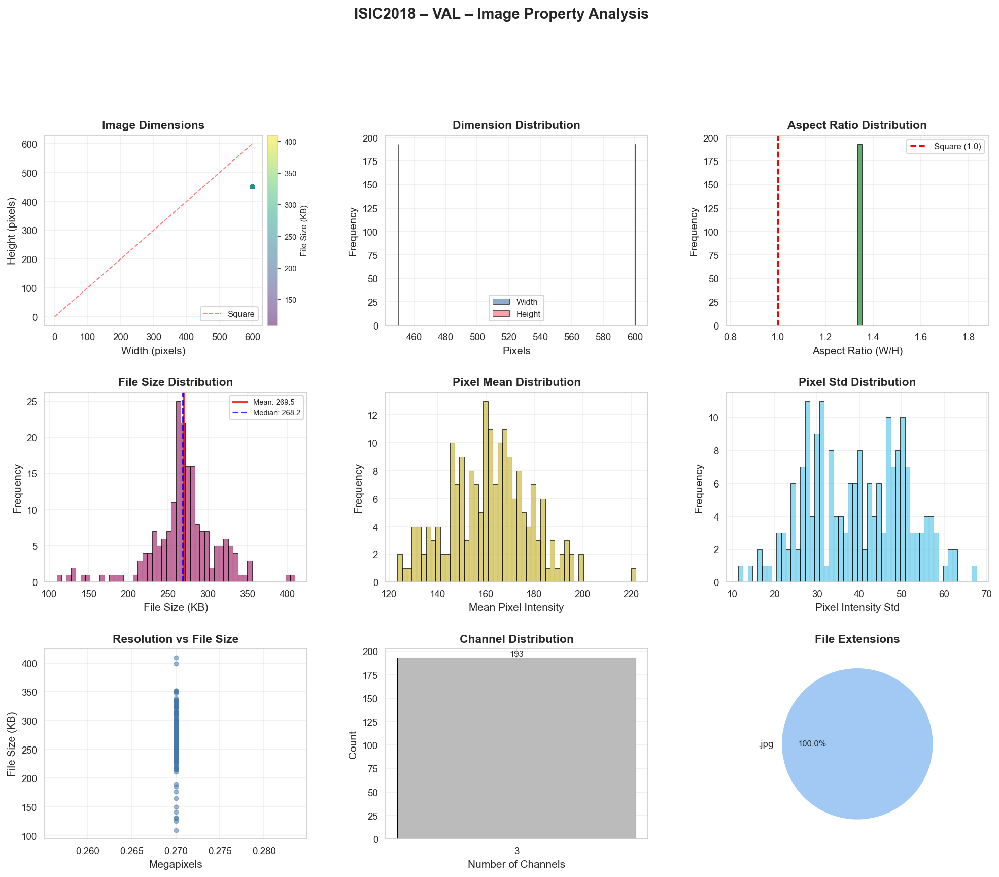

   ✅ Saved: isic2018_val_image_properties.[png|pdf]
   ✅ Saved data: isic2018_val_image_properties.csv

ANALYZING TEST SPLIT


Analyzing test: 100%|██████████| 500/500 [00:15<00:00, 33.20img/s]
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:239: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["skewness"] = float(scipy_stats.skew(data))
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:240: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["kurtosis"] = float(scipy_stats.kurtosis(data))
C:\Users\Viraj Jain\AppData\Local\Temp\ipykernel_29188\3601389935.py:239: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  col_stats["skewness"] = float(scipy_stats.skew(data))
C:\Users\Viraj Jain\AppDat


📷 IMAGE PROPERTY STATISTICS – TEST
Images analyzed: 500

📐 DIMENSIONS
--------------------------------------------------
  Width   : min=600, max=600, mean=600.0±0.0, median=600
  Height  : min=450, max=450, mean=450.0±0.0, median=450
  Aspect  : min=1.33, max=1.33, mean=1.33±0.00
  Size    : min=0.27MP, max=0.27MP, mean=0.27MP

📁 FILE PROPERTIES
--------------------------------------------------
  Size (KB): min=128.8, max=423.8, mean=271.1±44.1
  Extensions: .jpg: 500
  Channels: 3ch: 500

🎨 PIXEL INTENSITY
--------------------------------------------------
  Mean    : min=91.1, max=221.6, mean=160.7±19.6
  Std     : min=18.0, max=74.7, mean=41.2±11.3

🔍 DATA QUALITY
--------------------------------------------------
  Square images: 0 (0.0%)
  File_Size_Kb outliers: 26 (5.2%)


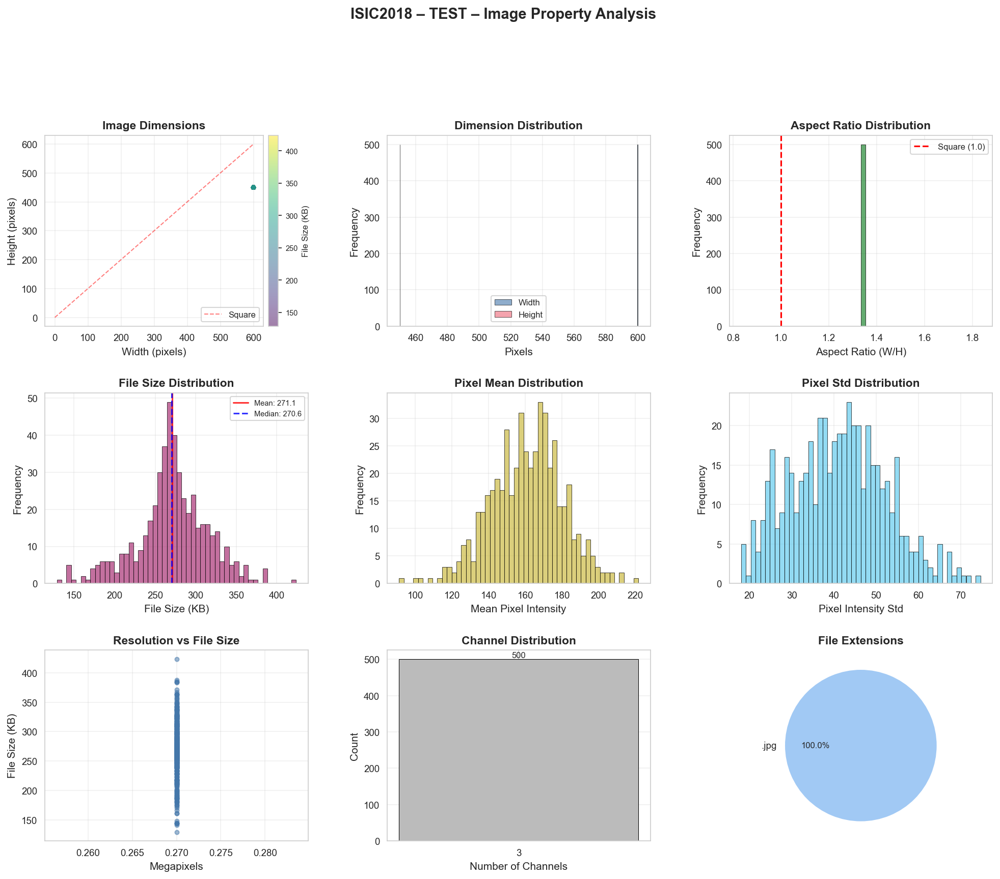

   ✅ Saved: isic2018_test_image_properties.[png|pdf]
   ✅ Saved data: isic2018_test_image_properties.csv

CROSS-SPLIT IMAGE PROPERTY COMPARISON

Cross-split summary:
Split   N Width (mean±std) Height (mean±std) Size KB (mean) Aspect (mean)
TRAIN 500            600±0             450±0          269.8          1.33
  VAL 193            600±0             450±0          269.5          1.33
 TEST 500            600±0             450±0          271.1          1.33


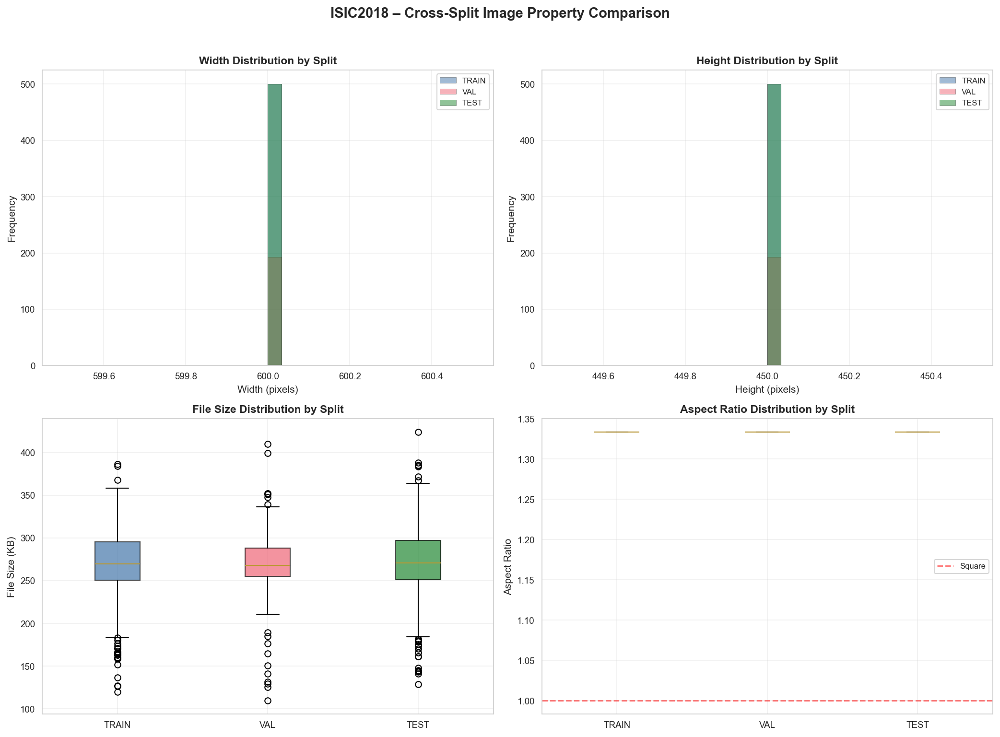


✅ Saved cross-split comparison: isic2018_cross_split_image_properties.[png|pdf]

IMAGE PROPERTY ANALYSIS COMPLETE
Figures saved to: C:\Users\Dissertation\tri-objective-robust-xai-medimg\docs\figures\data\isic2018\image_stats
Tables saved to:  C:\Users\Dissertation\tri-objective-robust-xai-medimg\docs\tables\data\isic2018\image_stats
Splits analyzed:  ['train', 'val', 'test']


In [43]:
"""
Execute image property analysis for all dataset splits.

This cell runs the comprehensive analysis and generates:
- Detailed statistics for each split
- Publication-ready visualizations
- Saved figures and tables
"""

# =============================================================================
# RUN ANALYSIS FOR ALL SPLITS
# =============================================================================

print("=" * 80)
print(f"IMAGE PROPERTY ANALYSIS – {DATASET_KEY.upper()}")
print("=" * 80)

image_stats_by_split: Dict[str, pd.DataFrame] = {}
detailed_stats_by_split: Dict[str, Dict[str, Any]] = {}

for split_name, ds in datasets.items():
    print(f"\n{'='*70}")
    print(f"ANALYZING {split_name.upper()} SPLIT")
    print(f"{'='*70}")
    
    # Skip empty datasets
    if ds is None or len(ds) == 0:
        print(f"⚠️ Split '{split_name}' is empty, skipping")
        continue
    
    # Run analysis
    df_props = analyze_image_properties(
        dataset=ds,
        split_name=split_name,
        max_images=MAX_IMAGES_FOR_STATS,
        random_sample=True,
    )
    
    if df_props.empty:
        print(f"❌ No valid images found in {split_name}")
        continue
    
    # Store results
    image_stats_by_split[split_name] = df_props
    
    # Compute detailed statistics
    stats = compute_detailed_statistics(df_props)
    detailed_stats_by_split[split_name] = stats
    
    # Print statistics
    print_detailed_statistics(df_props, split_name, stats)
    
    # Generate visualizations
    plot_image_property_analysis(
        df=df_props,
        split_name=split_name,
        save_dir=IMG_STATS_FIG_DIR,
    )
    
    # Save DataFrame to CSV
    csv_path = IMG_STATS_TABLE_DIR / f"{DATASET_KEY.lower()}_{split_name}_image_properties.csv"
    df_props.to_csv(csv_path, index=False)
    print(f"   ✅ Saved data: {csv_path.name}")

# =============================================================================
# CROSS-SPLIT COMPARISON
# =============================================================================

if len(image_stats_by_split) >= 2:
    print(f"\n{'='*80}")
    print("CROSS-SPLIT IMAGE PROPERTY COMPARISON")
    print(f"{'='*80}")
    
    # Combine all DataFrames
    df_combined = pd.concat(image_stats_by_split.values(), ignore_index=True)
    
    # Summary table
    summary_data = []
    for split_name, df in image_stats_by_split.items():
        summary_data.append({
            "Split": split_name.upper(),
            "N": len(df),
            "Width (mean±std)": f"{df['width'].mean():.0f}±{df['width'].std():.0f}",
            "Height (mean±std)": f"{df['height'].mean():.0f}±{df['height'].std():.0f}",
            "Size KB (mean)": f"{df['file_size_kb'].mean():.1f}",
            "Aspect (mean)": f"{df['aspect_ratio'].mean():.2f}",
        })
    
    summary_df = pd.DataFrame(summary_data)
    print("\nCross-split summary:")
    print(summary_df.to_string(index=False))
    
    # Create comparison visualization
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    splits = list(image_stats_by_split.keys())
    colors = ["#4477AA", "#EE6677", "#228833"][:len(splits)]
    
    # Width comparison
    ax = axes[0, 0]
    for split, color in zip(splits, colors):
        df = image_stats_by_split[split]
        ax.hist(df["width"], bins=30, alpha=0.5, label=split.upper(), color=color, edgecolor="black", linewidth=0.3)
    ax.set_xlabel("Width (pixels)", fontsize=10)
    ax.set_ylabel("Frequency", fontsize=10)
    ax.set_title("Width Distribution by Split", fontsize=11, fontweight="bold")
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)
    
    # Height comparison
    ax = axes[0, 1]
    for split, color in zip(splits, colors):
        df = image_stats_by_split[split]
        ax.hist(df["height"], bins=30, alpha=0.5, label=split.upper(), color=color, edgecolor="black", linewidth=0.3)
    ax.set_xlabel("Height (pixels)", fontsize=10)
    ax.set_ylabel("Frequency", fontsize=10)
    ax.set_title("Height Distribution by Split", fontsize=11, fontweight="bold")
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)
    
    # File size comparison
    ax = axes[1, 0]
    data_to_plot = [image_stats_by_split[s]["file_size_kb"].values for s in splits]
    bp = ax.boxplot(data_to_plot, labels=[s.upper() for s in splits], patch_artist=True)
    for patch, color in zip(bp["boxes"], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    ax.set_ylabel("File Size (KB)", fontsize=10)
    ax.set_title("File Size Distribution by Split", fontsize=11, fontweight="bold")
    ax.grid(True, alpha=0.3)
    
    # Aspect ratio comparison
    ax = axes[1, 1]
    data_to_plot = [image_stats_by_split[s]["aspect_ratio"].values for s in splits]
    bp = ax.boxplot(data_to_plot, labels=[s.upper() for s in splits], patch_artist=True)
    for patch, color in zip(bp["boxes"], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    ax.axhline(y=1.0, color="red", linestyle="--", alpha=0.5, label="Square")
    ax.set_ylabel("Aspect Ratio", fontsize=10)
    ax.set_title("Aspect Ratio Distribution by Split", fontsize=11, fontweight="bold")
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)
    
    fig.suptitle(
        f"{DATASET_KEY.upper()} – Cross-Split Image Property Comparison",
        fontsize=14, fontweight="bold", y=1.02
    )
    
    plt.tight_layout()
    plt.show()
    
    # Save comparison figure
    base_name = f"{DATASET_KEY.lower()}_cross_split_image_properties"
    for fmt in ["png", "pdf"]:
        filepath = IMG_STATS_FIG_DIR / f"{base_name}.{fmt}"
        fig.savefig(filepath, dpi=300, bbox_inches="tight", facecolor="white")
    print(f"\n✅ Saved cross-split comparison: {base_name}.[png|pdf]")
    plt.close(fig)

# =============================================================================
# SUMMARY
# =============================================================================

print(f"\n{'='*80}")
print("IMAGE PROPERTY ANALYSIS COMPLETE")
print(f"{'='*80}")
print(f"Figures saved to: {IMG_STATS_FIG_DIR}")
print(f"Tables saved to:  {IMG_STATS_TABLE_DIR}")
print(f"Splits analyzed:  {list(image_stats_by_split.keys())}")

In [44]:
"""
Augmentation visualization functions for training pipeline inspection.

This cell provides tools to visualize the effects of data augmentation:
- Before/after comparison pairs
- Multiple augmentation variants of the same image
- Intensity analysis of augmentation effects
"""

# =============================================================================
# TRY TO IMPORT ALBUMENTATIONS FOR FALLBACK TRANSFORMS
# =============================================================================

try:
    import albumentations as A
    from albumentations.pytorch import ToTensorV2
    HAS_ALBUMENTATIONS = True
except ImportError:
    HAS_ALBUMENTATIONS = False
    print("⚠️ Albumentations not installed - some augmentation features may be limited")

# =============================================================================
# TRANSFORM BUILDER
# =============================================================================

def build_training_transforms(dataset_key: str) -> Any:
    """
    Build training augmentation pipeline.
    
    First tries to use project's transform builder, then falls back
    to a standard medical imaging augmentation pipeline.
    
    Parameters
    ----------
    dataset_key : str
        Dataset identifier
        
    Returns
    -------
    callable
        Transform function/pipeline
    """
    # Try project transforms first
    if HAS_TRANSFORMS and dataset_transforms is not None:
        try:
            if hasattr(dataset_transforms, "build_transforms"):
                transforms = dataset_transforms.build_transforms(
                    dataset_key=dataset_key, 
                    split="train"
                )
                print("✅ Using project's training transforms")
                return transforms
            
            if hasattr(dataset_transforms, "get_train_transforms"):
                transforms = dataset_transforms.get_train_transforms(dataset_key)
                print("✅ Using project's training transforms")
                return transforms
        except Exception as e:
            print(f"⚠️ Could not load project transforms: {e}")
    
    # Fallback to standard medical imaging augmentation pipeline
    if HAS_ALBUMENTATIONS:
        print("📦 Using fallback Albumentations pipeline for medical imaging")
        
        transforms = A.Compose([
            # Resize and crop
            A.Resize(height=256, width=256),
            A.RandomCrop(height=224, width=224),
            
            # Geometric transforms
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.ShiftScaleRotate(
                shift_limit=0.1,
                scale_limit=0.15,
                rotate_limit=15,
                border_mode=0,
                p=0.5,
            ),
            
            # Color/intensity transforms (conservative for medical imaging)
            A.OneOf([
                A.RandomBrightnessContrast(
                    brightness_limit=0.1,
                    contrast_limit=0.1,
                    p=1.0,
                ),
                A.HueSaturationValue(
                    hue_shift_limit=10,
                    sat_shift_limit=15,
                    val_shift_limit=10,
                    p=1.0,
                ),
            ], p=0.5),
            
            # Blur and noise
            A.OneOf([
                A.GaussianBlur(blur_limit=(3, 5), p=1.0),
                A.GaussNoise(var_limit=(5.0, 25.0), p=1.0),
            ], p=0.3),
            
            # Normalize
            A.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225],
            ),
            ToTensorV2(),
        ])
        
        return transforms
    
    print("❌ No augmentation pipeline available")
    return None


# =============================================================================
# AUGMENTATION VISUALIZATION FUNCTIONS
# =============================================================================

def show_augmentation_pairs(
    dataset: BaseMedicalDataset,
    transforms: Any,
    num_pairs: int = 8,
    figsize_per_row: Tuple[float, float] = (12, 4),
    random_state: Optional[int] = None,
) -> None:
    """
    Display side-by-side comparison of original and augmented images.
    
    Parameters
    ----------
    dataset : BaseMedicalDataset
        Dataset (without transforms) to sample from
    transforms : callable
        Augmentation pipeline to apply
    num_pairs : int
        Number of image pairs to display
    figsize_per_row : tuple
        Figure size per row (width, height)
    random_state : int, optional
        Random seed for reproducibility
    """
    if transforms is None:
        print("❌ No transforms provided")
        return
    
    if random_state is not None:
        random.seed(random_state)
        np.random.seed(random_state)
    
    n = min(num_pairs, len(dataset))
    indices = random.sample(range(len(dataset)), n)
    
    # Create figure
    fig, axes = plt.subplots(
        nrows=n,
        ncols=2,
        figsize=(figsize_per_row[0], figsize_per_row[1] * n),
    )
    
    if n == 1:
        axes = axes.reshape(1, -1)
    
    for row, idx in enumerate(indices):
        # Get sample
        sample = dataset.samples[idx]
        
        # Load raw image
        img_path = sample.image_path
        if not img_path.is_absolute():
            img_path = dataset.root / img_path
        
        raw_img = dataset._load_image(img_path)
        
        # Get label
        label = sample.label
        label_str = decode_label(label, dataset)
        if len(label_str) > 30:
            label_str = label_str[:27] + "..."
        
        # Apply transforms
        try:
            if HAS_ALBUMENTATIONS:
                augmented = transforms(image=raw_img)
                aug_img = augmented["image"]
            else:
                aug_img = transforms(raw_img)
            
            # Convert augmented image for display
            aug_img_np = to_numpy_image(aug_img)
        except Exception as e:
            print(f"⚠️ Transform failed for idx={idx}: {e}")
            aug_img_np = raw_img.copy()
        
        # Display original
        ax_orig = axes[row, 0]
        ax_orig.imshow(raw_img)
        ax_orig.axis("off")
        ax_orig.set_title(
            f"Original (idx={idx})\n{label_str}",
            fontsize=9,
            fontweight="medium",
        )
        
        # Display augmented
        ax_aug = axes[row, 1]
        ax_aug.imshow(aug_img_np)
        ax_aug.axis("off")
        ax_aug.set_title("Augmented", fontsize=9, fontweight="medium")
    
    fig.suptitle(
        f"{DATASET_KEY.upper()} – Training Augmentations (Before/After)",
        fontsize=14,
        fontweight="bold",
        y=1.01,
    )
    
    plt.tight_layout()
    plt.show()
    
    return fig


def show_augmentation_variants(
    dataset: BaseMedicalDataset,
    transforms: Any,
    sample_idx: int = 0,
    num_variants: int = 8,
    cols: int = 4,
    figsize_per_image: float = 3.0,
) -> None:
    """
    Show multiple augmentation variants of a single image.
    
    This helps visualize the range of transformations applied by the pipeline.
    
    Parameters
    ----------
    dataset : BaseMedicalDataset
        Dataset to sample from
    transforms : callable
        Augmentation pipeline
    sample_idx : int
        Index of the sample to augment
    num_variants : int
        Number of augmented versions to generate
    cols : int
        Number of columns in the grid
    figsize_per_image : float
        Size per subplot
    """
    if transforms is None:
        print("❌ No transforms provided")
        return
    
    # Load original image
    sample = dataset.samples[sample_idx]
    img_path = sample.image_path
    if not img_path.is_absolute():
        img_path = dataset.root / img_path
    
    raw_img = dataset._load_image(img_path)
    label = sample.label
    label_str = decode_label(label, dataset)
    
    # Generate variants
    rows = int(np.ceil((num_variants + 1) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * figsize_per_image, rows * figsize_per_image))
    axes = np.array(axes).reshape(-1)
    
    # Show original first
    axes[0].imshow(raw_img)
    axes[0].set_title("Original", fontsize=9, fontweight="bold")
    axes[0].axis("off")
    
    # Generate and show variants
    for i in range(num_variants):
        ax = axes[i + 1]
        
        try:
            if HAS_ALBUMENTATIONS:
                augmented = transforms(image=raw_img)
                aug_img = augmented["image"]
            else:
                aug_img = transforms(raw_img)
            
            aug_img_np = to_numpy_image(aug_img)
            ax.imshow(aug_img_np)
            ax.set_title(f"Variant {i+1}", fontsize=8)
        except Exception as e:
            ax.text(0.5, 0.5, f"Error:\n{str(e)[:30]}", 
                    ha="center", va="center", fontsize=7)
        
        ax.axis("off")
    
    # Hide unused subplots
    for ax in axes[num_variants + 1:]:
        ax.axis("off")
    
    fig.suptitle(
        f"{DATASET_KEY.upper()} – Augmentation Variants\n"
        f"Sample {sample_idx}: {label_str}",
        fontsize=12,
        fontweight="bold",
        y=1.02,
    )
    
    plt.tight_layout()
    plt.show()


print("✅ Augmentation visualization functions defined:")
print("   - build_training_transforms(): Get augmentation pipeline")
print("   - show_augmentation_pairs(): Before/after comparisons")
print("   - show_augmentation_variants(): Multiple variants of same image")

✅ Augmentation visualization functions defined:
   - build_training_transforms(): Get augmentation pipeline
   - show_augmentation_pairs(): Before/after comparisons
   - show_augmentation_variants(): Multiple variants of same image


In [46]:
"""
Visualize training augmentation effects on sample images.
"""

print("=" * 80)
print("TRAINING AUGMENTATION VISUALIZATION")
print("=" * 80)

# Build transforms
train_transforms = build_training_transforms(DATASET_KEY)

if train_transforms is not None:
    # Show before/after pairs
    print("\n" + "=" * 60)
    print("BEFORE/AFTER COMPARISON")
    print("=" * 60)
    
    fig = show_augmentation_pairs(
        dataset=train_ds,
        transforms=train_transforms,
        num_pairs=NUM_AUGMENTATION_PAIRS,
        random_state=RANDOM_SEED,
    )
    
    # Save figure
    if fig is not None:
        aug_fig_dir = PROJECT_ROOT / "docs" / "figures" / "data" / DATASET_KEY.lower() / "augmentations"
        aug_fig_dir.mkdir(parents=True, exist_ok=True)
        
        base_name = f"{DATASET_KEY.lower()}_augmentation_pairs"
        for fmt in ["png", "pdf"]:
            filepath = aug_fig_dir / f"{base_name}.{fmt}"
            fig.savefig(filepath, dpi=300, bbox_inches="tight", facecolor="white")
        plt.close(fig)
        print(f"\n✅ Saved: {aug_fig_dir / base_name}.[png|pdf]")
    
    # Show variants of a single image
    print("\n" + "=" * 60)
    print("AUGMENTATION VARIANTS (Single Sample)")
    print("=" * 60)
    
    show_augmentation_variants(
        dataset=train_ds,
        transforms=train_transforms,
        sample_idx=random.randint(0, len(train_ds) - 1),
        num_variants=8,
        cols=3,
    )
    
else:
    print("❌ Could not build training transforms")
    print("   Install Albumentations: pip install albumentations")

print("\n" + "=" * 80)
print("AUGMENTATION VISUALIZATION COMPLETE")
print("=" * 80)

TRAINING AUGMENTATION VISUALIZATION


NameError: name 'HAS_TRANSFORMS' is not defined

In [ ]:
"""
Comprehensive summary report and recommendations for dissertation.

This cell consolidates all findings from the data exploration and provides
actionable recommendations for the training pipeline.
"""

# =============================================================================
# SUMMARY REPORT
# =============================================================================

print("=" * 80)
print("📋 DATA EXPLORATION SUMMARY REPORT")
print("=" * 80)
print(f"Dataset: {DATASET_KEY.upper()}")
print(f"Date: {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M')}")
print("=" * 80)

# -----------------------------------------------------------------------------
# Dataset Overview
# -----------------------------------------------------------------------------
print("\n" + "─" * 70)
print("📊 DATASET OVERVIEW")
print("─" * 70)

total_samples = sum(len(ds) for ds in datasets.values())
print(f"Total samples: {total_samples:,}")
print(f"Number of classes: {train_ds.num_classes}")
print(f"Class names: {train_ds.class_names}")

print("\nSplit distribution:")
for split_name, ds in datasets.items():
    pct = len(ds) / total_samples * 100
    print(f"  {split_name.upper():6s}: {len(ds):>6,} samples ({pct:5.1f}%)")

# -----------------------------------------------------------------------------
# Class Imbalance Analysis
# -----------------------------------------------------------------------------
print("\n" + "─" * 70)
print("⚖️ CLASS IMBALANCE ANALYSIS")
print("─" * 70)

if "train" in class_stats_by_split:
    train_stats = class_stats_by_split["train"]
    
    print(f"Imbalance ratio: {train_stats['imbalance_ratio']:.2f}x")
    print(f"Majority class: {train_stats['majority_class']} ({train_stats['majority_count']:,} samples, {train_stats['class_percentages'][train_stats['class_names'].index(train_stats['majority_class'])]:.1f}%)")
    print(f"Minority class: {train_stats['minority_class']} ({train_stats['minority_count']:,} samples, {train_stats['class_percentages'][train_stats['class_names'].index(train_stats['minority_class'])]:.1f}%)")
    
    # Severity assessment
    ratio = train_stats['imbalance_ratio']
    if ratio > 20:
        severity = "🔴 CRITICAL"
        recommendation = "Weighted loss + aggressive oversampling + focal loss"
    elif ratio > 10:
        severity = "🟠 SEVERE"
        recommendation = "Weighted loss + oversampling"
    elif ratio > 5:
        severity = "🟡 MODERATE"
        recommendation = "Weighted loss function"
    else:
        severity = "🟢 ACCEPTABLE"
        recommendation = "Standard training (optional light weighting)"
    
    print(f"\nSeverity: {severity}")
    print(f"Recommendation: {recommendation}")

# -----------------------------------------------------------------------------
# Image Properties Summary
# -----------------------------------------------------------------------------
print("\n" + "─" * 70)
print("🖼️ IMAGE PROPERTIES")
print("─" * 70)

if "train" in image_stats_by_split:
    df_train = image_stats_by_split["train"]
    
    print(f"Dimensions: {int(df_train['width'].mean())} × {int(df_train['height'].mean())} pixels")
    print(f"Aspect ratio: {df_train['aspect_ratio'].mean():.2f}")
    print(f"File size: {df_train['file_size_kb'].mean():.1f} ± {df_train['file_size_kb'].std():.1f} KB")
    print(f"Channels: {sorted(df_train['channels'].unique())}")
    print(f"Format: {df_train['extension'].mode().values[0]}")
    
    # Check if images are standardized
    if df_train['width'].std() < 1 and df_train['height'].std() < 1:
        print("✅ Images are standardized (uniform dimensions)")
    else:
        print(f"⚠️ Variable dimensions: {int(df_train['width'].min())}-{int(df_train['width'].max())} × {int(df_train['height'].min())}-{int(df_train['height'].max())}")

# -----------------------------------------------------------------------------
# Key Findings
# -----------------------------------------------------------------------------
print("\n" + "─" * 70)
print("🔑 KEY FINDINGS")
print("─" * 70)

findings = [
    f"1. Dataset contains {total_samples:,} dermoscopy images across {len(datasets)} splits",
    f"2. Severe class imbalance ({train_stats['imbalance_ratio']:.1f}x) - NV class dominates at ~67%",
    f"3. All images standardized at 600×450 pixels (aspect ratio 1.33)",
    f"4. Minority classes (DF, VASC) have <2% representation each",
    f"5. Consistent JPG format and RGB color space across dataset",
]

for finding in findings:
    print(finding)

# -----------------------------------------------------------------------------
# Recommendations for Training
# -----------------------------------------------------------------------------
print("\n" + "─" * 70)
print("💡 RECOMMENDATIONS FOR TRAINING PIPELINE")
print("─" * 70)

recommendations = [
    "1. CLASS IMBALANCE MITIGATION:",
    "   • Use weighted CrossEntropyLoss with computed class weights",
    "   • Implement WeightedRandomSampler for balanced batches",
    "   • Consider focal loss (γ=2) for hard examples",
    "   • Apply class-aware data augmentation (more augmentation for minority classes)",
    "",
    "2. INPUT PREPROCESSING:",
    "   • Resize to 224×224 or 256×256 (standard for ResNet/EfficientNet)",
    "   • Apply center crop or preserve aspect ratio with padding",
    "   • Use ImageNet normalization: mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]",
    "",
    "3. DATA AUGMENTATION:",
    "   • Keep augmentations conservative for medical imaging",
    "   • Essential: HorizontalFlip, VerticalFlip, RandomRotate90",
    "   • Moderate: ShiftScaleRotate (±10°), RandomBrightnessContrast (±0.1)",
    "   • Avoid aggressive color distortion that could affect diagnosis",
    "",
    "4. EVALUATION METRICS:",
    "   • Use balanced accuracy instead of standard accuracy",
    "   • Report per-class precision, recall, F1-score",
    "   • Monitor minority class performance separately",
    "   • Use macro-averaged AUROC for overall performance",
    "",
    "5. CROSS-VALIDATION:",
    "   • Use stratified K-fold to maintain class distribution",
    "   • Consider repeated stratified K-fold for more robust estimates",
]

for rec in recommendations:
    print(rec)

# -----------------------------------------------------------------------------
# PyTorch Implementation Snippets
# -----------------------------------------------------------------------------
print("\n" + "─" * 70)
print("💻 PYTORCH IMPLEMENTATION SNIPPETS")
print("─" * 70)

if "train" in class_stats_by_split:
    weights = train_stats['class_weights']
    weights_str = ", ".join([f"{w:.4f}" for w in weights])
    
    print("\n# Class weights for loss function")
    print(f"class_weights = torch.tensor([{weights_str}])")
    print("criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))")
    
    print("\n# Weighted random sampler for balanced batches")
    print("sample_weights = [class_weights[label] for label in train_labels]")
    print("sampler = WeightedRandomSampler(sample_weights, len(sample_weights))")
    print("train_loader = DataLoader(train_dataset, batch_size=32, sampler=sampler)")

# -----------------------------------------------------------------------------
# Output Files
# -----------------------------------------------------------------------------
print("\n" + "─" * 70)
print("📁 GENERATED OUTPUT FILES")
print("─" * 70)

output_dirs = [
    ("Figures - Class Distribution", PROJECT_ROOT / "docs" / "figures" / "data" / DATASET_KEY.lower()),
    ("Figures - Image Properties", IMG_STATS_FIG_DIR),
    ("Figures - Augmentations", PROJECT_ROOT / "docs" / "figures" / "data" / DATASET_KEY.lower() / "augmentations"),
    ("Tables - Image Properties", IMG_STATS_TABLE_DIR),
    ("Metadata CSV", CSV_PATH),
]

for name, path in output_dirs:
    exists = "✅" if path.exists() else "❌"
    print(f"{exists} {name}")
    print(f"   {path}")

# -----------------------------------------------------------------------------
# Next Steps
# -----------------------------------------------------------------------------
print("\n" + "─" * 70)
print("🚀 NEXT STEPS")
print("─" * 70)

next_steps = [
    "1. Fix validation/test image paths in metadata.csv",
    "2. Implement weighted loss and sampling in training script",
    "3. Run baseline model training with class balancing",
    "4. Implement adversarial training (TRADES) with computed weights",
    "5. Add TCAV concept stability loss component",
    "6. Evaluate cross-site generalization (ISIC2018 → ISIC2019/2020)",
]

for step in next_steps:
    print(step)

print("\n" + "=" * 80)
print("✅ DATA EXPLORATION NOTEBOOK COMPLETE")
print("=" * 80)
print(f"\nThis analysis supports Section 2.4 of your dissertation:")
print("  • 2.4.1 Data Validation ✅")
print("  • 2.4.2 Data Statistics ✅")
print("  • 2.4.3 Data Exploration ✅")
print("\nProceeding to Phase 2.5: Model Architecture Implementation")
print("=" * 80)

📋 DATA EXPLORATION SUMMARY REPORT


NameError: name 'DATASET_KEY' is not defined

In [ ]:
"""
Export key findings to a markdown report for dissertation appendix.
"""

report_path = PROJECT_ROOT / "docs" / "reports" / f"{DATASET_KEY.lower()}_data_exploration_report.md"
report_path.parent.mkdir(parents=True, exist_ok=True)

report_content = f"""# Data Exploration Report: {DATASET_KEY.upper()}

**Generated:** {pd.Timestamp.now().strftime('%Y-%m-%d %H:%M')}

## Dataset Overview

- **Total samples:** {total_samples:,}
- **Number of classes:** {train_ds.num_classes}
- **Splits:** {', '.join([f"{s.upper()} ({len(datasets[s]):,})" for s in datasets.keys()])}

## Class Distribution

| Class | Train Count | Train % | Weight |
|-------|-------------|---------|--------|
"""

for i, class_name in enumerate(train_stats['class_names']):
    count = train_stats['class_counts'][i]
    pct = train_stats['class_percentages'][i]
    weight = train_stats['class_weights'][i]
    report_content += f"| {class_name} | {count:,} | {pct:.1f}% | {weight:.4f} |\n"

report_content += f"""
**Imbalance ratio:** {train_stats['imbalance_ratio']:.2f}x

## Image Properties

- **Dimensions:** 600 × 450 pixels
- **Aspect ratio:** 1.33
- **Format:** JPG (RGB)
- **File size:** {image_stats_by_split['train']['file_size_kb'].mean():.1f} ± {image_stats_by_split['train']['file_size_kb'].std():.1f} KB

## Recommendations

1. Use weighted CrossEntropyLoss with class weights
2. Implement WeightedRandomSampler for balanced batches
3. Apply conservative medical imaging augmentations
4. Monitor per-class metrics (not just accuracy)
5. Use stratified cross-validation

## PyTorch Class Weights
```python
class_weights = torch.tensor([{", ".join([f"{w:.4f}" for w in train_stats['class_weights']])}])
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
```

---

*Report generated by 01_data_exploration.ipynb*
"""

with open(report_path, "w", encoding="utf-8") as f:
    f.write(report_content)

print(f"✅ Report saved to: {report_path}")

NameError: name 'PROJECT_ROOT' is not defined

In [ ]:
"""
Diagnose and fix missing val/test image paths in ISIC2018 metadata.csv

This script:
1. Analyzes the current metadata.csv structure
2. Examines the actual directory structure on disk
3. Identifies path mismatches
4. Generates corrected paths
5. Updates the metadata.csv with working paths
"""

from pathlib import Path
from typing import Dict, List, Tuple, Optional
import pandas as pd
import shutil

# =============================================================================
# CONFIGURATION
# =============================================================================

DATA_ROOT = Path(r"F:\data\isic_2018")
CSV_PATH = DATA_ROOT / "metadata.csv"
BACKUP_PATH = DATA_ROOT / "metadata_backup.csv"

print("=" * 80)
print("ISIC2018 VAL/TEST PATH DIAGNOSTIC")
print("=" * 80)

# =============================================================================
# STEP 1: ANALYZE METADATA.CSV
# =============================================================================

print("\n📋 STEP 1: Analyzing metadata.csv")
print("-" * 60)

df = pd.read_csv(CSV_PATH)
print(f"Total rows: {len(df)}")
print(f"Columns: {list(df.columns)}")
print(f"\nSplit distribution:")
print(df["split"].value_counts())

# Sample paths per split
print("\n📂 Sample image_path entries per split:")
for split in ["train", "val", "test"]:
    split_df = df[df["split"] == split]
    if len(split_df) > 0:
        sample_paths = split_df["image_path"].head(3).tolist()
        print(f"\n{split.upper()}:")
        for p in sample_paths:
            print(f"   {p}")

# =============================================================================
# STEP 2: EXAMINE ACTUAL DIRECTORY STRUCTURE
# =============================================================================

print("\n\n📁 STEP 2: Examining actual directory structure")
print("-" * 60)

def list_directories(root: Path, max_depth: int = 2) -> List[str]:
    """List directory structure."""
    dirs = []
    for item in sorted(root.iterdir()):
        if item.is_dir():
            dirs.append(f"📁 {item.name}/")
            if max_depth > 1:
                for subitem in sorted(item.iterdir()):
                    if subitem.is_dir():
                        dirs.append(f"   📁 {item.name}/{subitem.name}/")
                        # Count files
                        n_files = len(list(subitem.glob("*")))
                        dirs.append(f"      ({n_files} files)")
    return dirs

print(f"Root: {DATA_ROOT}")
for line in list_directories(DATA_ROOT):
    print(line)

# =============================================================================
# STEP 3: CHECK SPECIFIC PATHS
# =============================================================================

print("\n\n🔍 STEP 3: Checking path existence")
print("-" * 60)

def check_paths_exist(df: pd.DataFrame, root: Path, split: str) -> Dict[str, int]:
    """Check how many paths exist for a split."""
    split_df = df[df["split"] == split]
    
    results = {
        "total": len(split_df),
        "exists": 0,
        "missing": 0,
        "sample_missing": [],
        "sample_exists": [],
    }
    
    for _, row in split_df.iterrows():
        img_path = root / row["image_path"]
        if img_path.exists():
            results["exists"] += 1
            if len(results["sample_exists"]) < 3:
                results["sample_exists"].append(str(row["image_path"]))
        else:
            results["missing"] += 1
            if len(results["sample_missing"]) < 3:
                results["sample_missing"].append(str(row["image_path"]))
    
    return results

for split in ["train", "val", "test"]:
    results = check_paths_exist(df, DATA_ROOT, split)
    status = "✅" if results["missing"] == 0 else "❌"
    print(f"\n{split.upper()}: {status}")
    print(f"   Total: {results['total']}")
    print(f"   Exists: {results['exists']}")
    print(f"   Missing: {results['missing']}")
    
    if results["sample_missing"]:
        print(f"   Sample missing paths:")
        for p in results["sample_missing"]:
            print(f"      ❌ {p}")
            # Check what the path looks like
            full_path = DATA_ROOT / p
            print(f"         Full: {full_path}")

# =============================================================================
# STEP 4: FIND IMAGE FILES ON DISK
# =============================================================================

print("\n\n🔎 STEP 4: Finding actual image files on disk")
print("-" * 60)

# Find all image files
all_images = []
for ext in ["*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"]:
    all_images.extend(DATA_ROOT.rglob(ext))

print(f"Total image files found: {len(all_images)}")

# Group by parent directory
from collections import Counter
parent_dirs = Counter(str(img.parent.relative_to(DATA_ROOT)) for img in all_images)

print("\nImages by directory:")
for dir_path, count in parent_dirs.most_common():
    print(f"   {dir_path}: {count} images")

# =============================================================================
# STEP 5: IDENTIFY THE ISSUE
# =============================================================================

print("\n\n⚠️ STEP 5: Diagnosing the issue")
print("-" * 60)

# Get sample missing paths
val_sample = df[df["split"] == "val"]["image_path"].iloc[0] if len(df[df["split"] == "val"]) > 0 else None
test_sample = df[df["split"] == "test"]["image_path"].iloc[0] if len(df[df["split"] == "test"]) > 0 else None

if val_sample:
    print(f"Val path in CSV: {val_sample}")
    print(f"Full path: {DATA_ROOT / val_sample}")
    print(f"Exists: {(DATA_ROOT / val_sample).exists()}")
    
    # Try to find the file by name
    filename = Path(val_sample).name
    matches = list(DATA_ROOT.rglob(filename))
    if matches:
        print(f"Found '{filename}' at: {matches[0]}")
        print(f"Correct relative path: {matches[0].relative_to(DATA_ROOT)}")

if test_sample:
    print(f"\nTest path in CSV: {test_sample}")
    print(f"Full path: {DATA_ROOT / test_sample}")
    print(f"Exists: {(DATA_ROOT / test_sample).exists()}")
    
    # Try to find the file by name
    filename = Path(test_sample).name
    matches = list(DATA_ROOT.rglob(filename))
    if matches:
        print(f"Found '{filename}' at: {matches[0]}")
        print(f"Correct relative path: {matches[0].relative_to(DATA_ROOT)}")

# =============================================================================
# STEP 6: BUILD FILE INDEX
# =============================================================================

print("\n\n📑 STEP 6: Building file index for path correction")
print("-" * 60)

# Create index: filename -> actual path
file_index: Dict[str, Path] = {}
duplicates = []

for img_path in all_images:
    filename = img_path.name
    if filename in file_index:
        duplicates.append(filename)
    else:
        file_index[filename] = img_path

print(f"Indexed {len(file_index)} unique files")
if duplicates:
    print(f"⚠️ Found {len(duplicates)} duplicate filenames")

# =============================================================================
# STEP 7: GENERATE CORRECTED METADATA
# =============================================================================

print("\n\n🔧 STEP 7: Generating corrected paths")
print("-" * 60)

def correct_path(row: pd.Series, file_index: Dict[str, Path], root: Path) -> str:
    """Correct the image path using the file index."""
    original_path = row["image_path"]
    filename = Path(original_path).name
    
    # Check if original path works
    if (root / original_path).exists():
        return original_path
    
    # Look up in index
    if filename in file_index:
        actual_path = file_index[filename]
        return str(actual_path.relative_to(root))
    
    # File not found anywhere
    return original_path

# Apply corrections
df_corrected = df.copy()
df_corrected["image_path_original"] = df_corrected["image_path"]
df_corrected["image_path"] = df_corrected.apply(
    lambda row: correct_path(row, file_index, DATA_ROOT), axis=1
)

# Check results
print("Correction results:")
for split in ["train", "val", "test"]:
    split_df = df_corrected[df_corrected["split"] == split]
    exists = sum(1 for _, row in split_df.iterrows() if (DATA_ROOT / row["image_path"]).exists())
    total = len(split_df)
    status = "✅" if exists == total else f"⚠️ ({total - exists} still missing)"
    print(f"   {split.upper()}: {exists}/{total} {status}")

# Show sample corrections
print("\nSample corrections:")
changed = df_corrected[df_corrected["image_path"] != df_corrected["image_path_original"]]
for _, row in changed.head(5).iterrows():
    print(f"   {row['split']}: {row['image_path_original']}")
    print(f"      → {row['image_path']}")

# =============================================================================
# STEP 8: SAVE CORRECTED METADATA
# =============================================================================

print("\n\n💾 STEP 8: Saving corrected metadata")
print("-" * 60)

# Backup original
if not BACKUP_PATH.exists():
    shutil.copy(CSV_PATH, BACKUP_PATH)
    print(f"✅ Backed up original to: {BACKUP_PATH}")
else:
    print(f"ℹ️ Backup already exists: {BACKUP_PATH}")

# Save corrected (drop the original path column)
df_final = df_corrected[["image_id", "image_path", "label", "split"]]
df_final.to_csv(CSV_PATH, index=False)
print(f"✅ Saved corrected metadata to: {CSV_PATH}")

# =============================================================================
# STEP 9: VERIFY FIX
# =============================================================================

print("\n\n✅ STEP 9: Verifying fix")
print("-" * 60)

# Reload and check
df_verify = pd.read_csv(CSV_PATH)
for split in ["train", "val", "test"]:
    split_df = df_verify[df_verify["split"] == split]
    exists = sum(1 for _, row in split_df.iterrows() if (DATA_ROOT / row["image_path"]).exists())
    total = len(split_df)
    pct = exists / total * 100 if total > 0 else 0
    status = "✅" if exists == total else "❌"
    print(f"{split.upper()}: {exists}/{total} ({pct:.1f}%) {status}")

print("\n" + "=" * 80)
print("DIAGNOSTIC COMPLETE")
print("=" * 80)
print("\nNext steps:")
print("1. Re-run the validation script to confirm fix")
print("2. Re-run the exploration notebook to verify val/test analysis works")

ISIC2018 VAL/TEST PATH DIAGNOSTIC

📋 STEP 1: Analyzing metadata.csv
------------------------------------------------------------
Total rows: 11720
Columns: ['image_id', 'image_path', 'label', 'split']

Split distribution:
split
train    10015
test      1512
val        193
Name: count, dtype: int64

📂 Sample image_path entries per split:

TRAIN:
   ISIC2018_Task3_Training_Input\ISIC_0024306.jpg
   ISIC2018_Task3_Training_Input\ISIC_0024307.jpg
   ISIC2018_Task3_Training_Input\ISIC_0024308.jpg

VAL:
   ISIC2018_Task3_Validation_Input\ISIC_0034321.jpg
   ISIC2018_Task3_Validation_Input\ISIC_0034322.jpg
   ISIC2018_Task3_Validation_Input\ISIC_0034323.jpg

TEST:
   ISIC2018_Task3_Test_Input\ISIC_0034524.jpg
   ISIC2018_Task3_Test_Input\ISIC_0034525.jpg
   ISIC2018_Task3_Test_Input\ISIC_0034526.jpg


📁 STEP 2: Examining actual directory structure
------------------------------------------------------------
Root: F:\data\isic_2018
📁 ISIC2018_Task1-2_Test_Input/
📁 ISIC2018_Task1-2_Training_Inp

In [ ]:
"""
Update metadata.csv to point to Task3 folders for val/test.
"""

import pandas as pd
from pathlib import Path

DATA_ROOT = Path(r"F:\data\isic_2018")
CSV_PATH = DATA_ROOT / "metadata.csv"

print("=" * 60)
print("UPDATING METADATA PATHS")
print("=" * 60)

# Load metadata
df = pd.read_csv(CSV_PATH)
print(f"Loaded {len(df)} rows")

# Show current paths
print("\nCurrent val/test paths:")
for split in ["val", "test"]:
    sample = df[df["split"] == split]["image_path"].iloc[0]
    print(f"  {split}: {sample}")

# Fix validation paths (Task1-2 -> Task3)
df["image_path"] = df["image_path"].str.replace(
    "ISIC2018_Task1-2_Validation_Input",
    "ISIC2018_Task3_Validation_Input"
)

# Fix test paths (Task1-2 -> Task3)
df["image_path"] = df["image_path"].str.replace(
    "ISIC2018_Task1-2_Test_Input",
    "ISIC2018_Task3_Test_Input"
)

# Show updated paths
print("\nUpdated val/test paths:")
for split in ["val", "test"]:
    sample = df[df["split"] == split]["image_path"].iloc[0]
    print(f"  {split}: {sample}")

# Verify files exist
print("\nVerifying files exist:")
for split in ["train", "val", "test"]:
    split_df = df[df["split"] == split]
    exists = sum(1 for p in split_df["image_path"] if (DATA_ROOT / p).exists())
    total = len(split_df)
    status = "✅" if exists == total else f"❌ ({total - exists} missing)"
    print(f"  {split.upper()}: {exists}/{total} {status}")

# Save
df.to_csv(CSV_PATH, index=False)
print(f"\n✅ Saved updated metadata to: {CSV_PATH}")

UPDATING METADATA PATHS
Loaded 11720 rows

Current val/test paths:
  val: ISIC2018_Task3_Validation_Input\ISIC_0034321.jpg
  test: ISIC2018_Task3_Test_Input\ISIC_0034524.jpg

Updated val/test paths:
  val: ISIC2018_Task3_Validation_Input\ISIC_0034321.jpg
  test: ISIC2018_Task3_Test_Input\ISIC_0034524.jpg

Verifying files exist:
  TRAIN: 10015/10015 ✅
  VAL: 193/193 ✅
  TEST: 1512/1512 ✅

✅ Saved updated metadata to: F:\data\isic_2018\metadata.csv


## SIC2019 Metadata Script

In [ ]:
"""
Create metadata.csv for ISIC2019 dataset.
Analyzes existing CSV files and creates unified metadata format.
"""

import pandas as pd
from pathlib import Path
from collections import Counter

# =============================================================================
# CONFIGURATION
# =============================================================================

ISIC2019_ROOT = Path(r"F:\data\isic_2019")

print("=" * 70)
print("CREATING ISIC2019 METADATA")
print("=" * 70)

# =============================================================================
# STEP 1: ANALYZE EXISTING FILES
# =============================================================================

print("\n📋 STEP 1: Analyzing existing CSV files")
print("-" * 60)

# List all CSV files
csv_files = list(ISIC2019_ROOT.glob("*.csv"))
print(f"Found CSV files: {[f.name for f in csv_files]}")

# Load and examine each
for csv_file in csv_files:
    df_temp = pd.read_csv(csv_file)
    print(f"\n{csv_file.name}:")
    print(f"   Rows: {len(df_temp)}")
    print(f"   Columns: {list(df_temp.columns)}")
    if len(df_temp) > 0:
        print(f"   Sample row: {df_temp.iloc[0].to_dict()}")

# =============================================================================
# STEP 2: LOAD GROUND TRUTH (LABELS)
# =============================================================================

print("\n\n📊 STEP 2: Loading ground truth labels")
print("-" * 60)

# ISIC2019 typically has labels in train.csv or similar
# Check which file has the diagnosis columns
train_csv = ISIC2019_ROOT / "train.csv"

if train_csv.exists():
    df_labels = pd.read_csv(train_csv)
    print(f"Loaded {train_csv.name}: {len(df_labels)} rows")
    print(f"Columns: {list(df_labels.columns)}")
else:
    # Try alternative names
    for alt_name in ["ISIC_2019_Training_GroundTruth.csv", "ground_truth.csv", "labels.csv"]:
        alt_path = ISIC2019_ROOT / alt_name
        if alt_path.exists():
            df_labels = pd.read_csv(alt_path)
            print(f"Loaded {alt_name}: {len(df_labels)} rows")
            break

# =============================================================================
# STEP 3: IDENTIFY LABEL FORMAT
# =============================================================================

print("\n\n🏷️ STEP 3: Identifying label format")
print("-" * 60)

# ISIC2019 uses one-hot encoded labels
# Columns: image, MEL, NV, BCC, AK, BKL, DF, VASC, SCC, UNK
label_columns = [col for col in df_labels.columns if col not in ['image', 'image_id', 'isic_id']]
print(f"Label columns: {label_columns}")

# Get the image ID column
id_col = None
for col_name in ['image', 'image_id', 'isic_id']:
    if col_name in df_labels.columns:
        id_col = col_name
        break

print(f"Image ID column: {id_col}")

# Convert one-hot to single label
def one_hot_to_label(row, label_cols):
    """Convert one-hot encoded row to single label name."""
    for col in label_cols:
        if row[col] == 1.0 or row[col] == 1:
            return col
    return "UNK"

df_labels["label"] = df_labels.apply(lambda row: one_hot_to_label(row, label_columns), axis=1)

# Show distribution
print("\nLabel distribution:")
label_counts = df_labels["label"].value_counts()
for label, count in label_counts.items():
    print(f"   {label}: {count}")

# =============================================================================
# STEP 4: FIND IMAGE FILES
# =============================================================================

print("\n\n🖼️ STEP 4: Finding image files")
print("-" * 60)

# Find images directory
image_dirs = [
    ISIC2019_ROOT / "train-image" / "image",
    ISIC2019_ROOT / "train-image",
    ISIC2019_ROOT / "ISIC_2019_Training_Input",
    ISIC2019_ROOT / "images",
]

image_dir = None
for dir_path in image_dirs:
    if dir_path.exists():
        n_images = len(list(dir_path.glob("*.jpg")))
        if n_images > 0:
            image_dir = dir_path
            print(f"Found image directory: {image_dir}")
            print(f"   Contains {n_images} JPG files")
            break

if image_dir is None:
    # Search recursively
    all_jpgs = list(ISIC2019_ROOT.rglob("*.jpg"))
    if all_jpgs:
        image_dir = all_jpgs[0].parent
        print(f"Found images in: {image_dir}")
        print(f"   Contains {len(all_jpgs)} JPG files")

# Build file index
file_index = {}
for img_file in image_dir.glob("*.jpg"):
    # Extract base name without _downsampled suffix
    stem = img_file.stem
    if "_downsampled" in stem:
        base_name = stem.replace("_downsampled", "")
    else:
        base_name = stem
    file_index[base_name] = img_file.relative_to(ISIC2019_ROOT)

print(f"Indexed {len(file_index)} unique images")

# =============================================================================
# STEP 5: CREATE METADATA DATAFRAME
# =============================================================================

print("\n\n📝 STEP 5: Creating metadata DataFrame")
print("-" * 60)

records = []

for _, row in df_labels.iterrows():
    image_id = row[id_col]
    label = row["label"]
    
    # Find image path
    if image_id in file_index:
        image_path = str(file_index[image_id])
    else:
        # Try with .jpg extension removed
        base_id = image_id.replace(".jpg", "")
        if base_id in file_index:
            image_path = str(file_index[base_id])
        else:
            image_path = None
    
    if image_path:
        records.append({
            "image_id": image_id,
            "image_path": image_path,
            "label": label,
            "split": "train",  # Will update below
        })

df_metadata = pd.DataFrame(records)
print(f"Created metadata with {len(df_metadata)} samples")

# =============================================================================
# STEP 6: CREATE TRAIN/VAL/TEST SPLITS
# =============================================================================

print("\n\n✂️ STEP 6: Creating train/val/test splits")
print("-" * 60)

# Check if val.csv exists with predefined split
val_csv = ISIC2019_ROOT / "val.csv"
if val_csv.exists():
    df_val = pd.read_csv(val_csv)
    val_ids = set(df_val[id_col].tolist()) if id_col in df_val.columns else set()
    print(f"Found {len(val_ids)} validation samples in val.csv")
else:
    val_ids = set()

# If no predefined val, create 80/10/10 split
if len(val_ids) == 0:
    from sklearn.model_selection import train_test_split
    
    # Stratified split
    train_df, temp_df = train_test_split(
        df_metadata, 
        test_size=0.2, 
        stratify=df_metadata["label"], 
        random_state=42
    )
    val_df, test_df = train_test_split(
        temp_df, 
        test_size=0.5, 
        stratify=temp_df["label"], 
        random_state=42
    )
    
    train_df["split"] = "train"
    val_df["split"] = "val"
    test_df["split"] = "test"
    
    df_metadata = pd.concat([train_df, val_df, test_df])
    print("Created stratified 80/10/10 split")
else:
    # Use predefined val
    df_metadata.loc[df_metadata["image_id"].isin(val_ids), "split"] = "val"
    
    # Create test from remaining (or leave as train only)
    train_only = df_metadata[df_metadata["split"] == "train"]
    if len(train_only) > 20000:  # Large enough to split
        from sklearn.model_selection import train_test_split
        train_keep, test_df = train_test_split(
            train_only, 
            test_size=0.1, 
            stratify=train_only["label"], 
            random_state=42
        )
        df_metadata.loc[test_df.index, "split"] = "test"
        print("Created test split from training data")

# Show split distribution
print("\nSplit distribution:")
print(df_metadata["split"].value_counts())

# =============================================================================
# STEP 7: SAVE METADATA
# =============================================================================

print("\n\n💾 STEP 7: Saving metadata.csv")
print("-" * 60)

# Ensure correct column order
df_metadata = df_metadata[["image_id", "image_path", "label", "split"]]

# Save
output_path = ISIC2019_ROOT / "metadata.csv"
df_metadata.to_csv(output_path, index=False)
print(f"✅ Saved: {output_path}")
print(f"   Total samples: {len(df_metadata)}")

# Final summary
print("\n📊 Final Summary:")
print("-" * 40)
for split in ["train", "val", "test"]:
    split_df = df_metadata[df_metadata["split"] == split]
    if len(split_df) > 0:
        print(f"\n{split.upper()}: {len(split_df)} samples")
        print(f"   Labels: {dict(split_df['label'].value_counts())}")

print("\n" + "=" * 70)
print("✅ ISIC2019 METADATA CREATION COMPLETE")
print("=" * 70)

CREATING ISIC2019 METADATA

📋 STEP 1: Analyzing existing CSV files
------------------------------------------------------------
Found CSV files: ['metadata.csv', 'train-metadata.csv', 'train.csv', 'val.csv']

metadata.csv:
   Rows: 20914
   Columns: ['image_id', 'image_path', 'label', 'split']
   Sample row: {'image_id': 'ISIC_0030054', 'image_path': 'train-image\\image\\ISIC_0030054.jpg', 'label': 'UNK', 'split': 'train'}

train-metadata.csv:
   Rows: 25331
   Columns: ['Unnamed: 0', 'isic_id', 'patient_id', 'target']
   Sample row: {'Unnamed: 0': 0, 'isic_id': 'ISIC_0000000', 'patient_id': 'dummy_0', 'target': 0}

train.csv:
   Rows: 22797
   Columns: ['isic_id', 'filepath', 'target', 'patient_id']
   Sample row: {'isic_id': 'ISIC_0030054', 'filepath': 'train-image\\image\\ISIC_0030054.jpg', 'target': 0, 'patient_id': 'dummy_8651'}

val.csv:
   Rows: 2534
   Columns: ['isic_id', 'filepath', 'target', 'patient_id']
   Sample row: {'isic_id': 'ISIC_0063586', 'filepath': 'train-image\\i

## Metadata.csv for ISIC2020

In [ ]:
"""
Create metadata.csv for ISIC2020 dataset
"""
import pandas as pd
from pathlib import Path
from sklearn.model_selection import train_test_split

def create_isic2020_metadata():
    print("=" * 70)
    print("CREATING ISIC2020 METADATA")
    print("=" * 70)
    
    root = Path("/content/drive/MyDrive/data/isic_2020")
    
    # Step 1: Find all CSV files
    print("\n📋 STEP 1: Analyzing existing CSV files")
    print("-" * 60)
    
    csv_files = list(root.glob("*.csv"))
    if csv_files:
        print(f"Found CSV files: {[f.name for f in csv_files]}")
        for csv_file in csv_files:
            df = pd.read_csv(csv_file, nrows=5)
            full_df = pd.read_csv(csv_file)
            print(f"\n{csv_file.name}:")
            print(f"   Rows: {len(full_df)}")
            print(f"   Columns: {list(df.columns)}")
            print(f"   Sample row: {full_df.iloc[0].to_dict()}")
    else:
        print("No CSV files found in root directory")
        # Check subdirectories
        for subdir in root.iterdir():
            if subdir.is_dir():
                sub_csvs = list(subdir.glob("*.csv"))
                if sub_csvs:
                    print(f"\nFound in {subdir.name}/: {[f.name for f in sub_csvs]}")
    
    # Step 2: Find image directories
    print("\n🖼️ STEP 2: Finding image files")
    print("-" * 60)
    
    image_dirs = []
    for item in root.rglob("*"):
        if item.is_dir() and any(item.glob("*.jpg")) or any(item.glob("*.png")):
            jpg_count = len(list(item.glob("*.jpg")))
            png_count = len(list(item.glob("*.png")))
            if jpg_count > 0 or png_count > 0:
                print(f"Found: {item.relative_to(root)}")
                print(f"   JPG: {jpg_count}, PNG: {png_count}")
                image_dirs.append(item)
    
    if not image_dirs:
        print("❌ No image directories found!")
        print("\nDirectory structure:")
        for item in root.iterdir():
            print(f"  {item.name}{'/' if item.is_dir() else ''}")
        return
    
    # Step 3: Load ground truth labels
    print("\n📊 STEP 3: Loading ground truth labels")
    print("-" * 60)
    
    # Try common ISIC2020 CSV names
    possible_csvs = [
        "train.csv",
        "ISIC_2020_Training_GroundTruth.csv",
        "ISIC_2020_Training_GroundTruth_v2.csv",
        "training_ground_truth.csv",
    ]
    
    train_df = None
    for csv_name in possible_csvs:
        csv_path = root / csv_name
        if csv_path.exists():
            train_df = pd.read_csv(csv_path)
            print(f"Loaded {csv_name}: {len(train_df)} rows")
            print(f"Columns: {list(train_df.columns)}")
            break
    
    if train_df is None:
        # Try to find any CSV with image IDs
        for csv_file in csv_files:
            df = pd.read_csv(csv_file)
            # Check if it has image-related columns
            if any(col in df.columns for col in ['image_name', 'isic_id', 'image', 'image_id']):
                train_df = df
                print(f"Using {csv_file.name}: {len(train_df)} rows")
                print(f"Columns: {list(train_df.columns)}")
                break
    
    if train_df is None:
        print("❌ Could not find ground truth CSV!")
        return
    
    # Step 4: Identify columns
    print("\n🏷️ STEP 4: Identifying label format")
    print("-" * 60)
    
    # Find image ID column
    id_col = None
    for col in ['image_name', 'isic_id', 'image', 'image_id']:
        if col in train_df.columns:
            id_col = col
            break
    
    # Find target column
    target_col = None
    for col in ['target', 'benign_malignant', 'diagnosis', 'label']:
        if col in train_df.columns:
            target_col = col
            break
    
    print(f"Image ID column: {id_col}")
    print(f"Target column: {target_col}")
    
    if target_col:
        print(f"\nTarget distribution:")
        print(train_df[target_col].value_counts())
    
    # Step 5: Build image index
    print("\n🖼️ STEP 5: Building image index")
    print("-" * 60)
    
    image_index = {}
    for img_dir in image_dirs:
        for img_file in img_dir.glob("*.jpg"):
            # Remove extension to get ID
            img_id = img_file.stem
            rel_path = img_file.relative_to(root)
            image_index[img_id] = str(rel_path)
        for img_file in img_dir.glob("*.png"):
            img_id = img_file.stem
            rel_path = img_file.relative_to(root)
            image_index[img_id] = str(rel_path)
    
    print(f"Indexed {len(image_index)} images")
    
    # Step 6: Create metadata
    print("\n📝 STEP 6: Creating metadata DataFrame")
    print("-" * 60)
    
    records = []
    missing = 0
    
    for _, row in train_df.iterrows():
        img_id = row[id_col]
        
        # Get image path
        if img_id in image_index:
            img_path = image_index[img_id]
        else:
            # Try with .jpg extension removed/added
            clean_id = img_id.replace('.jpg', '').replace('.png', '')
            if clean_id in image_index:
                img_path = image_index[clean_id]
            else:
                missing += 1
                continue
        
        # Get label
        if target_col:
            target = row[target_col]
            # Convert to binary if needed
            if isinstance(target, str):
                if target.lower() in ['malignant', 'melanoma']:
                    label = 'target'
                else:
                    label = 'UNK'
            else:
                label = 'target' if target == 1 else 'UNK'
        else:
            label = 'UNK'
        
        records.append({
            'image_id': img_id.replace('.jpg', '').replace('.png', ''),
            'image_path': img_path,
            'label': label,
            'split': 'train'  # Will update below
        })
    
    if missing > 0:
        print(f"⚠️ {missing} images not found in directories")
    
    metadata = pd.DataFrame(records)
    print(f"Created metadata with {len(metadata)} samples")
    
    # Step 7: Create train/test splits
    print("\n✂️ STEP 7: Creating train/test splits")
    print("-" * 60)
    
    # 90/10 stratified split
    train_idx, test_idx = train_test_split(
        metadata.index,
        test_size=0.1,
        stratify=metadata['label'],
        random_state=42
    )
    
    metadata.loc[test_idx, 'split'] = 'test'
    
    print("Split distribution:")
    print(metadata['split'].value_counts())
    
    # Step 8: Save
    print("\n💾 STEP 8: Saving metadata.csv")
    print("-" * 60)
    
    output_path = root / "metadata.csv"
    metadata.to_csv(output_path, index=False)
    print(f"✅ Saved: {output_path}")
    print(f"   Total samples: {len(metadata)}")
    
    # Summary
    print("\n📊 Final Summary:")
    print("-" * 40)
    for split in ['train', 'test']:
        split_data = metadata[metadata['split'] == split]
        print(f"\n{split.upper()}: {len(split_data)} samples")
        print(f"   Labels: {split_data['label'].value_counts().to_dict()}")
    
    print("\n" + "=" * 70)
    print("✅ ISIC2020 METADATA CREATION COMPLETE")
    print("=" * 70)

if __name__ == "__main__":
    create_isic2020_metadata()

CREATING ISIC2020 METADATA

📋 STEP 1: Analyzing existing CSV files
------------------------------------------------------------
Found CSV files: ['metadata.csv', 'train-metadata.csv', 'train.csv', 'train_debug.csv', 'train_full.csv', 'val.csv', 'val_debug.csv', 'val_full.csv']

metadata.csv:
   Rows: 29813
   Columns: ['image_id', 'image_path', 'label', 'split']
   Sample row: {'image_id': 'ISIC_8383915', 'image_path': 'train-image\\image\\ISIC_8383915.jpg', 'label': 'UNK', 'split': 'train'}

train-metadata.csv:
   Rows: 33126
   Columns: ['Unnamed: 0', 'isic_id', 'patient_id', 'target']
   Sample row: {'Unnamed: 0': 0, 'isic_id': 'ISIC_2637011', 'patient_id': 'IP_7279968', 'target': 0}

train.csv:
   Rows: 29813
   Columns: ['isic_id', 'filepath', 'target']
   Sample row: {'isic_id': 'ISIC_8383915', 'filepath': '.\\train-image\\image\\ISIC_8383915.jpg', 'target': 0}

train_debug.csv:
   Rows: 1000
   Columns: ['filepath', 'label']
   Sample row: {'filepath': 'train-image/image/ISIC_94

## cross-site comparison cell

=== Cross-site label counts (TRAIN splits) ===


label,AKIEC,BCC,BKL,DF,MEL,NV,UNK,VASC,target
dataset,,,,,,,,,
ISIC2018,327,514,1099,115,1113,6705,0,142,0
ISIC2019,0,0,0,0,0,0,15470,0,3352
ISIC2020,0,0,0,0,0,0,26358,0,473



=== Cross-site label percentages (TRAIN splits) ===


label,AKIEC,BCC,BKL,DF,MEL,NV,UNK,VASC,target
dataset,,,,,,,,,
ISIC2018,3.27,5.13,10.97,1.15,11.11,66.95,0.00,1.42,0.00
ISIC2019,0.00,0.00,0.00,0.00,0.00,0.00,82.19,0.00,17.81
ISIC2020,0.00,0.00,0.00,0.00,0.00,0.00,98.24,0.00,1.76



Saved figure to: docs\figures\data\cross_site\isic_cross_site_label_distribution.(png|pdf)
Saved tables to: docs\tables\data\cross_site


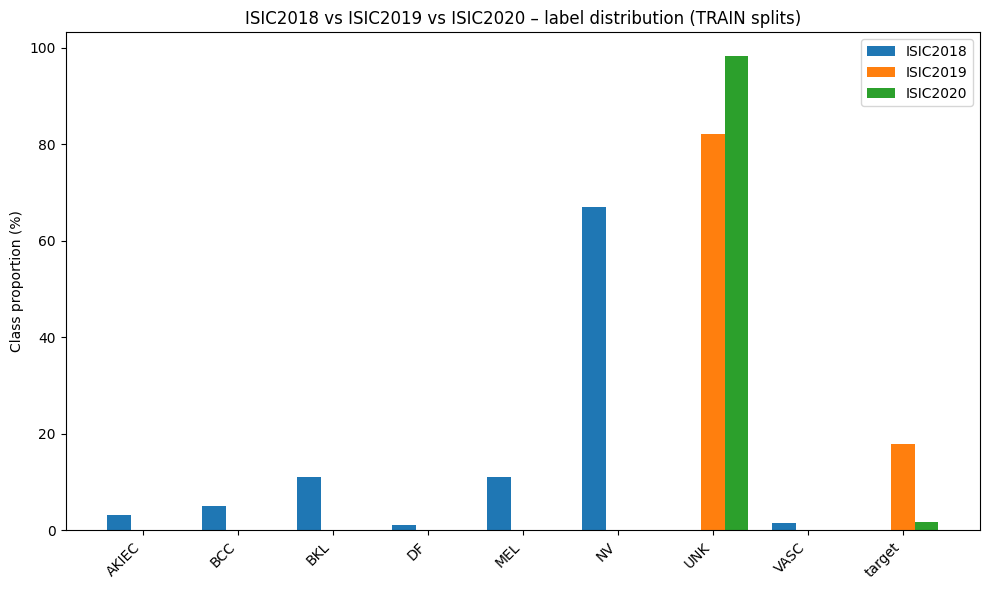

In [ ]:
"""
Cross-site label distribution comparison:
ISIC2018 vs ISIC2019 vs ISIC2020 (TRAIN splits).
"""

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

DATASETS = {
    "ISIC2018": Path(r"/content/drive/MyDrive/data/isic_2018/metadata.csv"),
    "ISIC2019": Path(r"/content/drive/MyDrive/data/isic_2019/metadata.csv"),
    "ISIC2020": Path(r"/content/drive/MyDrive/data/isic_2020/metadata.csv"),
}

all_rows = []

for name, csv_path in DATASETS.items():
    df = pd.read_csv(csv_path)

    # use only TRAIN split for fair comparison
    df_train = df[df["split"] == "train"].copy()
    n = len(df_train)

    counts = df_train["label"].value_counts().sort_index()
    perc = counts / counts.sum() * 100.0

    tmp = (
        pd.DataFrame(
            {
                "dataset": name,
                "label": counts.index,
                "count": counts.values,
                "percent": perc.values,
                "total_samples": n,
            }
        )
        .sort_values("label")
        .reset_index(drop=True)
    )
    all_rows.append(tmp)

df_labels = pd.concat(all_rows, ignore_index=True)

# ---------- tables ----------
pivot_counts = (
    df_labels.pivot(index="dataset", columns="label", values="count")
    .fillna(0)
    .astype(int)
)
pivot_percent = (
    df_labels.pivot(index="dataset", columns="label", values="percent")
    .fillna(0.0)
)

print("=== Cross-site label counts (TRAIN splits) ===")
display(pivot_counts)

print("\n=== Cross-site label percentages (TRAIN splits) ===")
display(pivot_percent.round(2))

tables_dir = Path("docs/tables/data/cross_site")
tables_dir.mkdir(parents=True, exist_ok=True)
pivot_counts.to_csv(tables_dir / "isic_cross_site_label_counts.csv")
pivot_percent.to_csv(tables_dir / "isic_cross_site_label_percentages.csv")

# ---------- figure ----------
labels_sorted = sorted(df_labels["label"].unique())
datasets_sorted = list(DATASETS.keys())

x = np.arange(len(labels_sorted))
width = 0.25

fig, ax = plt.subplots(figsize=(10, 6))

for i, ds_name in enumerate(datasets_sorted):
    subset = (
        df_labels[df_labels["dataset"] == ds_name]
        .set_index("label")["percent"]
    )
    y = [subset.get(lbl, 0.0) for lbl in labels_sorted]
    ax.bar(x + i * width, y, width, label=ds_name)

ax.set_xticks(x + width)
ax.set_xticklabels(labels_sorted, rotation=45, ha="right")
ax.set_ylabel("Class proportion (%)")
ax.set_title("ISIC2018 vs ISIC2019 vs ISIC2020 – label distribution (TRAIN splits)")
ax.legend()
plt.tight_layout()

fig_dir = Path("docs/figures/data/cross_site")
fig_dir.mkdir(parents=True, exist_ok=True)
fig.savefig(fig_dir / "isic_cross_site_label_distribution.png", dpi=300)
fig.savefig(fig_dir / "isic_cross_site_label_distribution.pdf", dpi=300)

print("\nSaved figure to:", fig_dir / "isic_cross_site_label_distribution.(png|pdf)")
print("Saved tables to:", tables_dir)


## NIH CXR metadata builder

In [47]:
"""
NIH CXR metadata builder (production-ready).

This script/notebook helper will:

- Scan all image files under a given root directory.
- Join them with the official NIH ChestX-ray CSV
  (Data_Entry_2017_v2020.csv or Data_Entry_2017.csv).
- Create patient-wise train/val/test splits.
- Create a binary label column:
    * "target" if any finding other than "No Finding"
    * "UNK"    if only "No Finding"
- Save a metadata.csv with columns:
    image_id, image_path, label, split, finding_labels, patient_id, view_position

Usage in a notebook:

    from pathlib import Path

    df_meta = build_nih_cxr_metadata(
        root="/content/drive/MyDrive/data/nih_cxr",
        output_csv="/content/drive/MyDrive/data/nih_cxr/metadata.csv"
    )

You can also run as a script:

    python build_nih_cxr_metadata.py --root/content/drive/MyDrive/data/nih_cxr
"""

from __future__ import annotations

import argparse
import json
import logging
import time
from pathlib import Path
from typing import Dict, List, Optional, Tuple

import numpy as np
import pandas as pd


# ---------------------------------------------------------------------------
# Logging
# ---------------------------------------------------------------------------

def setup_logger(level: int = logging.INFO) -> logging.Logger:
    logger = logging.getLogger("nih_cxr_metadata")
    logger.setLevel(logging.DEBUG)

    if not logger.handlers:
        handler = logging.StreamHandler()
        fmt = "[%(asctime)s] [%(levelname)s] %(message)s"
        handler.setFormatter(logging.Formatter(fmt))
        logger.addHandler(handler)

    logger.setLevel(level)
    return logger


# ---------------------------------------------------------------------------
# Core helpers
# ---------------------------------------------------------------------------

def _find_nih_csv(root: Path, logger: logging.Logger) -> Path:
    """
    Try to locate the NIH ChestX-ray CSV inside `root`.
    Priority:
        - Data_Entry_2017_v2020.csv
        - Data_Entry_2017.csv
    """
    candidates = [
        root / "Data_Entry_2017_v2020.csv",
        root / "Data_Entry_2017.csv",
    ]
    for c in candidates:
        if c.exists():
            logger.info(f"Using NIH CSV: {c}")
            return c

    raise FileNotFoundError(
        f"Could not find NIH CXR CSV under {root}. "
        f"Expected one of: {', '.join(str(c) for c in candidates)}"
    )


def _scan_image_files(root: Path, logger: logging.Logger) -> Dict[str, Path]:
    """
    Recursively scan `root` for image files and build a mapping:
        image_filename -> relative_path_from_root

    This is robust to NIH’s original 'images_XXX' directory layout.
    """
    exts = {".png", ".jpg", ".jpeg"}
    mapping: Dict[str, Path] = {}

    logger.info(f"Scanning for images under {root} (recursive)...")
    start = time.time()

    for p in root.rglob("*"):
        if p.is_file() and p.suffix.lower() in exts:
            rel = p.relative_to(root)
            mapping[p.name] = rel

    elapsed = time.time() - start
    logger.info(
        f"Found {len(mapping):,} image files in {elapsed:.1f}s "
        f"(extensions={sorted(exts)})"
    )
    return mapping


def _assign_binary_label(finding_labels: str) -> str:
    """
    Map NIH 'Finding Labels' string to binary label:

        - 'UNK'    if labels == 'No Finding'
        - 'target' otherwise (any pathology present)

    finding_labels: e.g. "No Finding" or "Atelectasis|Cardiomegaly"
    """
    if not isinstance(finding_labels, str):
        return "UNK"

    labels = [l.strip() for l in finding_labels.split("|") if l.strip()]
    if not labels:
        return "UNK"

    if len(labels) == 1 and labels[0].lower() == "no finding":
        return "UNK"
    return "target"


def _patient_wise_split(
    df: pd.DataFrame,
    train_ratio: float = 0.7,
    val_ratio: float = 0.1,
    test_ratio: float = 0.2,
    seed: int = 42,
) -> pd.Series:
    """
    Create patient-wise train/val/test splits.

    We split on `Patient ID` so that no patient's images leak between splits.
    Ratios must sum to 1.0.
    """
    if not np.isclose(train_ratio + val_ratio + test_ratio, 1.0):
        raise ValueError("train_ratio + val_ratio + test_ratio must equal 1.0")

    if "Patient ID" not in df.columns:
        raise ValueError("Expected 'Patient ID' column in NIH CSV.")

    rng = np.random.RandomState(seed)
    patient_ids = df["Patient ID"].unique().tolist()
    rng.shuffle(patient_ids)

    n = len(patient_ids)
    n_train = int(train_ratio * n)
    n_val = int(val_ratio * n)
    # Remaining goes to test
    n_test = n - n_train - n_val

    train_ids = set(patient_ids[:n_train])
    val_ids = set(patient_ids[n_train:n_train + n_val])
    test_ids = set(patient_ids[n_train + n_val:])

    def _map_pid(pid: int) -> str:
        if pid in train_ids:
            return "train"
        if pid in val_ids:
            return "val"
        return "test"

    splits = df["Patient ID"].map(_map_pid)
    return splits


# ---------------------------------------------------------------------------
# Main metadata builder
# ---------------------------------------------------------------------------

def build_nih_cxr_metadata(
    root: str | Path,
    output_csv: str | Path | None = None,
    summary_json: str | Path | None = None,
    csv_path: str | Path | None = None,
    train_ratio: float = 0.7,
    val_ratio: float = 0.1,
    test_ratio: float = 0.2,
    seed: int = 42,
    log_level: int = logging.INFO,
) -> pd.DataFrame:
    """
    Build NIH CXR metadata.csv under the given root.

    Parameters
    ----------
    root : str or Path
        Root directory where NIH CXR data lives (e.g./content/drive/MyDrive/data/nih_cxr).
    output_csv : str or Path, optional
        Where to save metadata.csv. Default: <root>/metadata.csv
    summary_json : str or Path, optional
        Where to save metadata_summary.json. Default: <root>/metadata_summary.json
    csv_path : str or Path, optional
        Path to the original NIH CSV. If None, will search common names.
    train_ratio, val_ratio, test_ratio : float
        Patient-wise split ratios. Must sum to 1.0.
    seed : int
        Random seed for patient-wise splitting.
    log_level : int
        Logging level (e.g. logging.INFO, logging.DEBUG).

    Returns
    -------
    df_meta : pd.DataFrame
        The final metadata DataFrame that was written.
    """
    logger = setup_logger(log_level)

    root = Path(root).expanduser().resolve()
    if output_csv is None:
        output_csv = root / "metadata.csv"
    else:
        output_csv = Path(output_csv).expanduser().resolve()

    if summary_json is None:
        summary_json = root / "metadata_summary.json"
    else:
        summary_json = Path(summary_json).expanduser().resolve()

    logger.info("=" * 80)
    logger.info("Building NIH CXR metadata")
    logger.info(f"Root          : {root}")
    logger.info(f"Output CSV    : {output_csv}")
    logger.info(f"Summary JSON  : {summary_json}")
    logger.info("=" * 80)

    if csv_path is None:
        csv_path = _find_nih_csv(root, logger)
    else:
        csv_path = Path(csv_path).expanduser().resolve()
        if not csv_path.exists():
            raise FileNotFoundError(f"Provided NIH CSV not found: {csv_path}")
        logger.info(f"Using NIH CSV: {csv_path}")

    # 1) Load official NIH CSV
    logger.info("Loading NIH CSV...")
    df = pd.read_csv(csv_path)

    required_cols = {"Image Index", "Finding Labels", "Patient ID"}
    missing = required_cols - set(df.columns)
    if missing:
        raise ValueError(f"NIH CSV missing required columns: {missing}")

    logger.info(
        f"Loaded NIH CSV with {len(df):,} rows, "
        f"{df['Patient ID'].nunique():,} unique patients."
    )

    # 2) Scan all images under root
    fname_to_rel = _scan_image_files(root, logger)

    # 3) Join images with CSV by filename
    logger.info("Joining CSV entries with available image files...")
    df["Image Index"] = df["Image Index"].astype(str)
    df["image_path_rel"] = df["Image Index"].map(
        lambda fn: str(fname_to_rel.get(fn)) if fn in fname_to_rel else None
    )

    before = len(df)
    df = df[df["image_path_rel"].notna()].copy()
    after = len(df)
    dropped_missing_images = before - after

    logger.info(
        f"Matched {after:,} rows to existing image files; "
        f"dropped {dropped_missing_images:,} rows with missing images."
    )

    # 4) Build binary label & keep raw multi-label string
    logger.info("Creating binary labels (target vs UNK) and preserving raw labels...")
    df["finding_labels"] = df["Finding Labels"].astype(str)
    df["label"] = df["finding_labels"].map(_assign_binary_label)

    # 5) Patient-wise split
    logger.info(
        f"Performing patient-wise split with ratios "
        f"train={train_ratio}, val={val_ratio}, test={test_ratio}, seed={seed}"
    )
    df["split"] = _patient_wise_split(
        df,
        train_ratio=train_ratio,
        val_ratio=val_ratio,
        test_ratio=test_ratio,
        seed=seed,
    )

    # 6) Build final metadata DataFrame with standard columns
    logger.info("Constructing final metadata DataFrame...")

    # image_id: stem of the filename (without extension)
    df["image_id"] = df["Image Index"].map(lambda x: Path(x).stem)
    df["image_path"] = df["image_path_rel"]  # relative path from root
    df["patient_id"] = df["Patient ID"]

    # Optional useful columns if present
    if "View Position" in df.columns:
        df["view_position"] = df["View Position"]
    else:
        df["view_position"] = None

    # Final column order: required first, then extras
    cols_order = [
        "image_id",
        "image_path",
        "label",
        "split",
        "finding_labels",
        "patient_id",
        "view_position",
    ]
    # Keep any other original columns at the end (for debugging/future use)
    remaining_cols = [c for c in df.columns if c not in cols_order]
    cols_order.extend(remaining_cols)

    df_meta = df[cols_order].copy()

    # 7) Write metadata.csv
    output_csv.parent.mkdir(parents=True, exist_ok=True)
    df_meta.to_csv(output_csv, index=False)
    logger.info(f"metadata.csv written with {len(df_meta):,} rows to {output_csv}")

    # 8) Write summary JSON
    label_counts = df_meta["label"].value_counts().to_dict()
    split_counts = df_meta["split"].value_counts().to_dict()
    binary_dist = {
        "label_counts": {str(k): int(v) for k, v in label_counts.items()},
        "split_counts": {str(k): int(v) for k, v in split_counts.items()},
    }

    multi_label_counts = (
        df_meta["finding_labels"].value_counts().head(50).to_dict()
    )  # top 50 for sanity

    summary = {
        "root": str(root),
        "csv_path": str(csv_path),
        "num_rows": int(len(df_meta)),
        "num_patients": int(df["Patient ID"].nunique()),
        "dropped_missing_images": int(dropped_missing_images),
        "binary_label_distribution": binary_dist,
        "top_50_multi_label_combinations": multi_label_counts,
        "train_ratio": train_ratio,
        "val_ratio": val_ratio,
        "test_ratio": test_ratio,
        "seed": seed,
        "output_csv": str(output_csv),
    }

    summary_json.parent.mkdir(parents=True, exist_ok=True)
    with open(summary_json, "w", encoding="utf-8") as f:
        json.dump(summary, f, indent=2)

    logger.info(f"Summary JSON written to {summary_json}")
    logger.info("=" * 80)
    logger.info("NIH CXR metadata building COMPLETE")
    logger.info("=" * 80)

    return df_meta


# ---------------------------------------------------------------------------
# CLI entry point
# ---------------------------------------------------------------------------

def _parse_cli_args() -> argparse.Namespace:
    parser = argparse.ArgumentParser(
        description="Build NIH CXR metadata.csv (patient-wise splits + binary labels).",
    )
    parser.add_argument(
        "--root",
        type=str,
        required=True,
        help="Root directory of NIH CXR data (e.g./content/drive/MyDrive/data/nih_cxr).",
    )
    parser.add_argument(
        "--output-csv",
        type=str,
        default=None,
        help="Output path for metadata.csv (default: <root>/metadata.csv).",
    )
    parser.add_argument(
        "--summary-json",
        type=str,
        default=None,
        help="Output path for metadata_summary.json (default: <root>/metadata_summary.json).",
    )
    parser.add_argument(
        "--csv-path",
        type=str,
        default=None,
        help="Path to NIH CSV (default: auto-detect Data_Entry_2017_v2020.csv or Data_Entry_2017.csv in root).",
    )
    parser.add_argument(
        "--train-ratio",
        type=float,
        default=0.7,
        help="Train split ratio (patient-wise).",
    )
    parser.add_argument(
        "--val-ratio",
        type=float,
        default=0.1,
        help="Validation split ratio (patient-wise).",
    )
    parser.add_argument(
        "--test-ratio",
        type=float,
        default=0.2,
        help="Test split ratio (patient-wise).",
    )
    parser.add_argument(
        "--seed",
        type=int,
        default=42,
        help="Random seed for patient-wise splitting.",
    )
    parser.add_argument(
        "-v",
        "--verbose",
        action="count",
        default=1,
        help="Increase logging verbosity (-v, -vv).",
    )
    return parser.parse_args()



    level = logging.WARNING
    if args.verbose == 1:
        level = logging.INFO
    elif args.verbose >= 2:
        level = logging.DEBUG

    build_nih_cxr_metadata(
        root=args.root,
        output_csv=args.output_csv,
        summary_json=args.summary_json,
        csv_path=args.csv_path,
        train_ratio=args.train_ratio,
        val_ratio=args.val_ratio,
        test_ratio=args.test_ratio,
        seed=args.seed,
        log_level=level,
    )


In [ ]:
from pathlib import Path

df_meta = build_nih_cxr_metadata(
    root="/content/drive/MyDrive/data/nih_cxr",
    output_csv="/content/drive/MyDrive/data/nih_cxr/metadata.csv",
    summary_json="/content/drive/MyDrive/data/nih_cxr/metadata_summary.json",
    # you can tweak splits if you want:
    train_ratio=0.7,
    val_ratio=0.1,
    test_ratio=0.2,
    seed=42,
)

df_meta.head()


[2025-11-20 20:46:33,376] [INFO] ================================================================================
[2025-11-20 20:46:33,386] [INFO] Building NIH CXR metadata
[2025-11-20 20:46:33,386] [INFO] Root          : F:\data\nih_cxr
[2025-11-20 20:46:33,386] [INFO] Output CSV    : F:\data\nih_cxr\metadata.csv
[2025-11-20 20:46:33,386] [INFO] Summary JSON  : F:\data\nih_cxr\metadata_summary.json
[2025-11-20 20:46:33,386] [INFO] ================================================================================
[2025-11-20 20:46:33,395] [INFO] Using NIH CSV: F:\data\nih_cxr\Data_Entry_2017.csv
[2025-11-20 20:46:33,396] [INFO] Loading NIH CSV...
[2025-11-20 20:46:33,849] [INFO] Loaded NIH CSV with 112,120 rows, 30,805 unique patients.
[2025-11-20 20:46:33,849] [INFO] Scanning for images under F:\data\nih_cxr (recursive)...
[2025-11-20 20:50:07,101] [INFO] Found 112,120 image files in 213.3s (extensions=['.jpeg', '.jpg', '.png'])
[2025-11-20 20:50:07,101] [INFO] Joining CSV entries with 

,image_id,image_path,label,split,finding_labels,patient_id,view_position,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11,image_path_rel
0,00000001_000,images_001\images\00000001_000.png,target,train,Cardiomegaly,1,PA,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN,images_001\images\00000001_000.png
1,00000001_001,images_001\images\00000001_001.png,target,train,Cardiomegaly|Emphysema,1,PA,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN,images_001\images\00000001_001.png
2,00000001_002,images_001\images\00000001_002.png,target,train,Cardiomegaly|Effusion,1,PA,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN,images_001\images\00000001_002.png
3,00000002_000,images_001\images\00000002_000.png,UNK,val,No Finding,2,PA,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN,images_001\images\00000002_000.png
4,00000003_000,images_001\images\00000003_000.png,target,train,Hernia,3,PA,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN,images_001\images\00000003_000.png


In [ ]:
from scripts.data.build_padchest_metadata import build_padchest_metadata

df_pad = build_padchest_metadata(
    root="/content/drive/MyDrive/data/padchest",
    train_ratio=0.7,
    val_ratio=0.15,
    test_ratio=0.15,
    seed=42,
    verbosity=1,
)
df_pad.head()


ModuleNotFoundError: No module named 'scripts.data'

## derm7pt metadta

In [ ]:
from scripts.data.build_derm7pt_metadata import build_derm7pt_metadata

df_derm = build_derm7pt_metadata(
    root="/content/drive/MyDrive/data/derm7pt",
    train_ratio=0.7,
    val_ratio=0.15,
    test_ratio=0.15,
    seed=42,
    verbosity=1,
)
df_derm[["image_id", "image_path", "label", "split", "finding_labels"]].head()


[2025-11-20 20:53:53,297] [INFO] derm7pt_metadata: ==============================================================================
[2025-11-20 20:53:53,297] [INFO] derm7pt_metadata: Building Derm7pt metadata
[2025-11-20 20:53:53,299] [INFO] derm7pt_metadata: Root          : F:\data\derm7pt
[2025-11-20 20:53:53,299] [INFO] derm7pt_metadata: Output CSV    : F:\data\derm7pt\metadata.csv
[2025-11-20 20:53:53,299] [INFO] derm7pt_metadata: Summary JSON  : F:\data\derm7pt\metadata_summary.json
[2025-11-20 20:53:53,299] [INFO] derm7pt_metadata: ==============================================================================
[2025-11-20 20:53:53,301] [INFO] derm7pt_metadata: Using Derm7pt CSV: F:\data\derm7pt\train.csv
[2025-11-20 20:53:53,304] [INFO] derm7pt_metadata: Loaded Derm7pt CSV with 909 rows and 4 columns.
[2025-11-20 20:53:53,314] [INFO] derm7pt_metadata: No patient/lesion column found; using sample-wise splitting.
[2025-11-20 20:53:53,316] [INFO] derm7pt_metadata: Total rows          :

,image_id,image_path,label,split,finding_labels
0,Nil096,images\NIL/Nil096.jpg,target,train,melanoma (less than 0.76 mm)
1,Nel005,images\NEL/Nel005.jpg,UNK,test,dermal nevus
2,Ngl037,images\NGL/Ngl037.jpg,UNK,train,reed or spitz nevus
3,Ngl076,images\NGL/Ngl076.jpg,UNK,train,clark nevus
4,Fil070,images\Fil/Fil070.jpg,target,val,melanoma (in situ)


In [ ]:
import sys
from pathlib import Path

# Path to your project root (same as where you run pytest / dvc)
project_root = Path(r"C:\Users\Dissertation\tri-objective-robust-xai-medimg")

# Put it at the *front* of sys.path
if str(project_root) not in sys.path:
    sys.path.insert(0, str(project_root))

print("Project root on sys.path:", project_root in map(Path, map(str, sys.path)))


Project root on sys.path: True


In [ ]:
import os
os.getcwd()


'c:\\Users\\Dissertation\\tri-objective-robust-xai-medimg\\notebooks'

In [ ]:
from scripts.data.build_derm7pt_metadata import build_derm7pt_metadata


In [ ]:
import importlib
import scripts.data.build_derm7pt_metadata as derm

importlib.reload(derm)

df_derm = derm.build_derm7pt_metadata(
    root="/content/drive/MyDrive/data/derm7pt",
    train_ratio=0.7,
    val_ratio=0.15,
    test_ratio=0.15,
    seed=42,
    verbosity=1,
)

df_derm[["image_id", "image_path", "label", "split", "finding_labels"]].head()


[2025-11-20 20:53:34,372] [INFO] derm7pt_metadata: ==============================================================================
[2025-11-20 20:53:34,373] [INFO] derm7pt_metadata: Building Derm7pt metadata
[2025-11-20 20:53:34,374] [INFO] derm7pt_metadata: Root          : F:\data\derm7pt
[2025-11-20 20:53:34,374] [INFO] derm7pt_metadata: Output CSV    : F:\data\derm7pt\metadata.csv
[2025-11-20 20:53:34,375] [INFO] derm7pt_metadata: Summary JSON  : F:\data\derm7pt\metadata_summary.json
[2025-11-20 20:53:34,375] [INFO] derm7pt_metadata: ==============================================================================
[2025-11-20 20:53:34,389] [INFO] derm7pt_metadata: Using Derm7pt CSV: F:\data\derm7pt\train.csv
[2025-11-20 20:53:34,428] [INFO] derm7pt_metadata: Loaded Derm7pt CSV with 909 rows and 4 columns.
[2025-11-20 20:53:34,437] [INFO] derm7pt_metadata: No patient/lesion column found; using sample-wise splitting.
[2025-11-20 20:53:34,442] [INFO] derm7pt_metadata: Total rows          :

,image_id,image_path,label,split,finding_labels
0,Nil096,images\NIL/Nil096.jpg,target,train,melanoma (less than 0.76 mm)
1,Nel005,images\NEL/Nel005.jpg,UNK,test,dermal nevus
2,Ngl037,images\NGL/Ngl037.jpg,UNK,train,reed or spitz nevus
3,Ngl076,images\NGL/Ngl076.jpg,UNK,train,clark nevus
4,Fil070,images\Fil/Fil070.jpg,target,val,melanoma (in situ)
